# Projet 7   Implémentez un modèle de scoring

# Part 4 : Tune HyperParameters

### Import libraries

In [13]:

import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
import random
from random import randint

import warnings
warnings.filterwarnings("ignore")

#yellowbrick
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.classifier import ClassificationReport,ROCAUC,ConfusionMatrix

#shap
import shap

#lime
from lime import lime_tabular


# Classifiers
from lightgbm import LGBMClassifier,plot_importance
import lightgbm as lgbm


# optuna
import optuna
from optuna.integration import LightGBMPruningCallback

# Model selection
from sklearn.model_selection import StratifiedKFold
from sklearn.inspection import partial_dependence,PartialDependenceDisplay
# Metrics

from sklearn.metrics import( f1_score,confusion_matrix,classification_report,make_scorer,precision_score,
                            recall_score,precision_recall_fscore_support, ConfusionMatrixDisplay,
                            roc_auc_score, roc_curve,accuracy_score,get_scorer_names,fbeta_score,
                            log_loss,make_scorer
                           )


# Plotting functions
import seaborn as sns
from matplotlib import pyplot as plt


### loading data

In [14]:
X_train=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\X_train_mod.csv')
X_val=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\X_val_mod.csv')
y_train=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\y_train_mod.csv')
y_val=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\y_val_mod.csv')

In [15]:
X_train.shape , X_val.shape,y_train.shape,y_val.shape

((215257, 55), (92254, 55), (215257, 1), (92254, 1))

### Setting up optimization

 ###  OPTUNA

### Optimization of hyperparameters 

In [16]:
def objective(trial, X, y):
    param_grid = {
        "objective": "binary",
        "class_weight": "balanced",
        "verbose": -1,
        "boosting_type": "gbdt",
        "n_estimators": trial.suggest_int("n_estimators", 50, 500, step=50),        # Number of boosted trees to fit
        "learning_rate": trial.suggest_float("learning_rate", 1e-7, 1.0, log=True), # Boosting learning rate
        "max_depth": trial.suggest_int("max_depth", 2, 16, step=2),               # Maximum tree depth for base learners, <=0 means no limit 
        "num_leaves": trial.suggest_int("num_leaves", 3, 12, step=2),               # Maximum tree leaves for base learners
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),        # Minimal number of data in one leaf
        "lambda_l1": trial.suggest_loguniform("lambda_l1", 1e-8, 10.0),
        "lambda_l2": trial.suggest_loguniform("lambda_l2", 1e-8, 10.0),
        "reg_alpha": trial.suggest_loguniform( "reg_alpha",1e-9, 100.0,),       # L1 regularization
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "subsample":trial.suggest_uniform("subsample", 0.01, 1.0),             # Subsample ratio of the training instance
        "subsample_freq": trial.suggest_int( "subsample_freq", 0, 10),            # Frequency of subsample, <=0 means no enable    
        "min_child_weight": trial.suggest_uniform("min_child_weight", 0.01, 10.0),     # Minimum sum of instance weight (hessian) needed in a child (leaf)
        "feature_fraction": trial.suggest_uniform("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "max_bin":trial.suggest_int ("max_bin",10, 1000),                       # Max number of bins that feature values will be bucketed
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.3, 0.8 , step=1),# Subsample ratio of columns when constructing each tree
    }

 
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1234)

    cv_scores = np.empty(5)
    
    for idx, (train_index, test_index) in enumerate(cv.split(X, y)):
               
        X_train, X_val = X.take(list(train_index),axis=0), X.take(list(test_index),axis=0)
        y_train, y_val = y.take(list(train_index),axis=0), y.take(list(test_index),axis=0)
    
        model = lgbm.LGBMClassifier(**param_grid, n_jobs=-2, random_state=1234)
        
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_val, y_val)],
            eval_metric="binary_logloss",
            callbacks=[LightGBMPruningCallback(trial, "binary_logloss")])  # Add a pruning callback
        
        predics = model.predict_proba(X_val)
        cv_scores[idx] = log_loss(y_val, predics)
                
    return np.mean(cv_scores)

In [17]:
study = optuna.create_study(direction='minimize',study_name="LBGM Classifier")

func = lambda trial: objective(trial, X_train, y_train)

study.optimize(func, n_trials=300)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

[I 2023-08-30 22:34:17,977] A new study created in memory with name: LBGM Classifier
[I 2023-08-30 22:34:35,554] Trial 0 finished with value: 0.6928309117055 and parameters: {'n_estimators': 200, 'learning_rate': 2.3359094054176873e-05, 'max_depth': 4, 'num_leaves': 5, 'min_data_in_leaf': 1700, 'min_child_samples': 40, 'lambda_l1': 2.3357783167673135e-05, 'lambda_l2': 0.010174302398588792, 'reg_alpha': 1.3389658208725885, 'min_gain_to_split': 10.898058919064225, 'subsample': 0.5256057827061548, 'subsample_freq': 9, 'min_child_weight': 9.549259246892523, 'feature_fraction': 0.7765838352822361, 'bagging_fraction': 0.49276248540609474, 'bagging_freq': 5, 'max_bin': 232, 'colsample_bytree': 0.3}. Best is trial 0 with value: 0.6928309117055.
[I 2023-08-30 22:34:54,507] Trial 1 finished with value: 0.6015354643177513 and parameters: {'n_estimators': 150, 'learning_rate': 0.8992209552064687, 'max_depth': 6, 'num_leaves': 3, 'min_data_in_leaf': 9400, 'min_child_samples': 57, 'lambda_l1': 1.138

[I 2023-08-30 22:39:15,632] Trial 18 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:39:17,769] Trial 19 pruned. Trial was pruned at iteration 50.
[I 2023-08-30 22:39:19,002] Trial 20 pruned. Trial was pruned at iteration 1.
[I 2023-08-30 22:39:23,995] Trial 21 pruned. Trial was pruned at iteration 200.
[I 2023-08-30 22:39:26,246] Trial 22 pruned. Trial was pruned at iteration 50.
[I 2023-08-30 22:39:27,356] Trial 23 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:40:07,972] Trial 24 finished with value: 0.5917063661143278 and parameters: {'n_estimators': 350, 'learning_rate': 0.1666774299794381, 'max_depth': 12, 'num_leaves': 9, 'min_data_in_leaf': 2800, 'min_child_samples': 88, 'lambda_l1': 3.5502068084297607e-07, 'lambda_l2': 3.2411411907432603e-06, 'reg_alpha': 0.7345056842526451, 'min_gain_to_split': 11.923230991022077, 'subsample': 0.208053260034313, 'subsample_freq': 1, 'min_child_weight': 5.193705403099826, 'feature_fraction': 0.4805529115641126, 'bagging_fr

[I 2023-08-30 22:43:28,873] Trial 44 finished with value: 0.5902272887904083 and parameters: {'n_estimators': 150, 'learning_rate': 0.46725725367069026, 'max_depth': 6, 'num_leaves': 11, 'min_data_in_leaf': 2400, 'min_child_samples': 60, 'lambda_l1': 4.740862757700075e-05, 'lambda_l2': 1.0720570145020453e-05, 'reg_alpha': 0.569334207246121, 'min_gain_to_split': 8.017629760854826, 'subsample': 0.40236987111420874, 'subsample_freq': 5, 'min_child_weight': 7.024070701232341, 'feature_fraction': 0.852958531645568, 'bagging_fraction': 0.8578473767743827, 'bagging_freq': 4, 'max_bin': 510, 'colsample_bytree': 0.3}. Best is trial 38 with value: 0.5871708779991802.
[I 2023-08-30 22:43:30,019] Trial 45 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:43:31,129] Trial 46 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:43:45,921] Trial 47 finished with value: 0.5870198880307853 and parameters: {'n_estimators': 100, 'learning_rate': 0.2552732707997239, 'max_depth': 10, 'num_leav

[I 2023-08-30 22:45:53,819] Trial 73 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:46:06,753] Trial 74 finished with value: 0.5906255401484767 and parameters: {'n_estimators': 50, 'learning_rate': 0.6485221789273642, 'max_depth': 4, 'num_leaves': 11, 'min_data_in_leaf': 900, 'min_child_samples': 59, 'lambda_l1': 0.00011935378154158714, 'lambda_l2': 6.73731541412131e-05, 'reg_alpha': 0.06185120424726449, 'min_gain_to_split': 8.195554940102436, 'subsample': 0.6244829263156884, 'subsample_freq': 6, 'min_child_weight': 5.3882730550501305, 'feature_fraction': 0.7246495223834067, 'bagging_fraction': 0.7878537028596537, 'bagging_freq': 3, 'max_bin': 936, 'colsample_bytree': 0.3}. Best is trial 47 with value: 0.5870198880307853.
[I 2023-08-30 22:46:07,955] Trial 75 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:46:09,109] Trial 76 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:46:10,277] Trial 77 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:46:11,

[I 2023-08-30 22:51:00,079] Trial 107 pruned. Trial was pruned at iteration 33.
[I 2023-08-30 22:51:25,485] Trial 108 finished with value: 0.5841525386305868 and parameters: {'n_estimators': 250, 'learning_rate': 0.5347102013083235, 'max_depth': 12, 'num_leaves': 11, 'min_data_in_leaf': 2700, 'min_child_samples': 31, 'lambda_l1': 2.442332911653364e-05, 'lambda_l2': 0.0002492046318146419, 'reg_alpha': 0.6263746715579517, 'min_gain_to_split': 6.745928419093679, 'subsample': 0.3852222531848357, 'subsample_freq': 4, 'min_child_weight': 5.966894680982677, 'feature_fraction': 0.6929964470794507, 'bagging_fraction': 0.7561476758073071, 'bagging_freq': 2, 'max_bin': 665, 'colsample_bytree': 0.3}. Best is trial 106 with value: 0.5800841779633485.
[I 2023-08-30 22:51:27,939] Trial 109 pruned. Trial was pruned at iteration 33.
[I 2023-08-30 22:51:49,303] Trial 110 finished with value: 0.5839626456427365 and parameters: {'n_estimators': 200, 'learning_rate': 0.5171772888130886, 'max_depth': 12, 'n

[I 2023-08-30 22:55:50,735] Trial 127 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:55:51,927] Trial 128 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 22:56:13,403] Trial 129 finished with value: 0.5777576236019972 and parameters: {'n_estimators': 200, 'learning_rate': 0.6694789518819705, 'max_depth': 14, 'num_leaves': 11, 'min_data_in_leaf': 3400, 'min_child_samples': 5, 'lambda_l1': 6.77797479846857e-06, 'lambda_l2': 0.0007272395188234529, 'reg_alpha': 2.429852475722305, 'min_gain_to_split': 5.500073039249433, 'subsample': 0.4205757508470542, 'subsample_freq': 3, 'min_child_weight': 6.045371980027309, 'feature_fraction': 0.6639391676953915, 'bagging_fraction': 0.7599491140924016, 'bagging_freq': 1, 'max_bin': 670, 'colsample_bytree': 0.3}. Best is trial 122 with value: 0.5713088794980934.
[I 2023-08-30 22:56:15,397] Trial 130 pruned. Trial was pruned at iteration 23.
[I 2023-08-30 22:56:35,954] Trial 131 finished with value: 0.5771345535996206 and parameters: {'n

[I 2023-08-30 23:00:08,959] Trial 163 pruned. Trial was pruned at iteration 18.
[I 2023-08-30 23:00:10,093] Trial 164 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:00:33,592] Trial 165 finished with value: 0.5757773851375532 and parameters: {'n_estimators': 200, 'learning_rate': 0.5930309508896707, 'max_depth': 14, 'num_leaves': 11, 'min_data_in_leaf': 3200, 'min_child_samples': 5, 'lambda_l1': 6.893512329727212e-06, 'lambda_l2': 0.00040685908485009096, 'reg_alpha': 3.505868862330473, 'min_gain_to_split': 5.492171019071828, 'subsample': 0.3139599466110724, 'subsample_freq': 2, 'min_child_weight': 5.7053478974337954, 'feature_fraction': 0.656024969431777, 'bagging_fraction': 0.68774342484776, 'bagging_freq': 1, 'max_bin': 771, 'colsample_bytree': 0.3}. Best is trial 122 with value: 0.5713088794980934.
[I 2023-08-30 23:00:35,054] Trial 166 pruned. Trial was pruned at iteration 6.
[I 2023-08-30 23:00:57,545] Trial 167 finished with value: 0.5781402637236592 and parameters: {'n

[I 2023-08-30 23:04:08,013] Trial 205 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:09,240] Trial 206 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:10,404] Trial 207 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:11,580] Trial 208 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:12,850] Trial 209 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:13,968] Trial 210 pruned. Trial was pruned at iteration 1.
[I 2023-08-30 23:04:15,101] Trial 211 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:16,622] Trial 212 pruned. Trial was pruned at iteration 18.
[I 2023-08-30 23:04:17,782] Trial 213 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:19,369] Trial 214 pruned. Trial was pruned at iteration 24.
[I 2023-08-30 23:04:20,726] Trial 215 pruned. Trial was pruned at iteration 7.
[I 2023-08-30 23:04:21,869] Trial 216 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:04:23,377] Trial 217 pruned. Tria

[I 2023-08-30 23:07:13,037] Trial 294 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:07:14,302] Trial 295 pruned. Trial was pruned at iteration 6.
[I 2023-08-30 23:07:15,532] Trial 296 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:07:16,724] Trial 297 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:07:17,905] Trial 298 pruned. Trial was pruned at iteration 0.
[I 2023-08-30 23:07:19,060] Trial 299 pruned. Trial was pruned at iteration 0.


Number of finished trials: 300
Best trial: {'n_estimators': 250, 'learning_rate': 0.6511324969064881, 'max_depth': 14, 'num_leaves': 11, 'min_data_in_leaf': 2800, 'min_child_samples': 10, 'lambda_l1': 2.4609420352489817e-05, 'lambda_l2': 0.0004026817159978214, 'reg_alpha': 1.7798461656681892, 'min_gain_to_split': 4.7055586380493715, 'subsample': 0.39612701457360955, 'subsample_freq': 2, 'min_child_weight': 5.800548193913063, 'feature_fraction': 0.6730611516180612, 'bagging_fraction': 0.747540126461669, 'bagging_freq': 1, 'max_bin': 725, 'colsample_bytree': 0.3}


In [18]:
#montre les résultats et les best_score des essais
optuna.visualization.plot_optimization_history(study)

In [19]:
# dataframe avec les détails des essais
study.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_bagging_fraction,params_bagging_freq,params_colsample_bytree,params_feature_fraction,params_lambda_l1,...,params_min_child_samples,params_min_child_weight,params_min_data_in_leaf,params_min_gain_to_split,params_n_estimators,params_num_leaves,params_reg_alpha,params_subsample,params_subsample_freq,state
0,0,0.692831,2023-08-30 22:34:17.980236,2023-08-30 22:34:35.538561,0 days 00:00:17.558325,0.492762,5,0.3,0.776584,2.335778e-05,...,40,9.549259,1700,10.898059,200,5,1.338966e+00,0.525606,9,COMPLETE
1,1,0.601535,2023-08-30 22:34:35.554753,2023-08-30 22:34:54.500289,0 days 00:00:18.945536,0.965918,6,0.3,0.497440,1.138699e-06,...,57,9.430654,9400,13.545194,150,3,1.981190e+01,0.407132,2,COMPLETE
2,2,0.692943,2023-08-30 22:34:54.508372,2023-08-30 22:35:09.894320,0 days 00:00:15.385948,0.768075,5,0.3,0.872960,1.431593e-03,...,50,6.992821,2000,10.435068,100,9,4.400267e-06,0.734091,8,COMPLETE
3,3,0.690040,2023-08-30 22:35:09.910929,2023-08-30 22:35:18.352994,0 days 00:00:08.442065,0.453139,5,0.3,0.748972,6.821840e-05,...,10,5.332588,8600,10.690108,50,7,1.722196e-09,0.862816,2,COMPLETE
4,4,0.693114,2023-08-30 22:35:18.369197,2023-08-30 22:36:11.686668,0 days 00:00:53.317471,0.809416,4,0.3,0.613380,2.266869e-08,...,66,0.453448,700,2.175586,400,11,1.195051e-02,0.160220,0,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,295,0.617830,2023-08-30 23:07:13.037219,2023-08-30 23:07:14.302856,0 days 00:00:01.265637,0.787265,1,0.3,0.655622,1.167044e-05,...,12,6.901813,3000,5.085554,250,11,9.263994e+01,0.292383,2,PRUNED
296,296,0.693006,2023-08-30 23:07:14.302856,2023-08-30 23:07:15.532782,0 days 00:00:01.229926,0.536918,1,0.3,0.683865,4.982153e-06,...,22,6.054176,3200,5.647815,200,11,5.513027e+00,0.353976,1,PRUNED
297,297,0.693135,2023-08-30 23:07:15.532782,2023-08-30 23:07:16.724080,0 days 00:00:01.191298,0.693210,1,0.3,0.632295,7.528041e-05,...,69,5.838344,2500,6.171863,200,11,1.659184e+01,0.419173,2,PRUNED
298,298,0.691389,2023-08-30 23:07:16.724080,2023-08-30 23:07:17.905141,0 days 00:00:01.181061,0.735496,1,0.3,0.667435,1.298862e-07,...,7,1.998051,2700,5.349777,200,11,8.335580e-04,0.381267,3,PRUNED


In [20]:
#plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
optuna.visualization.plot_parallel_coordinate(study)

In [21]:
'''plot_slice: shows the evolution of the search. You can see where in the hyperparameter space your search
went and which parts of the space were explored more.'''
optuna.visualization.plot_slice(study)

In [22]:
#Visualize parameter importances.
optuna.visualization.plot_param_importances(study)

In [23]:
#plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
optuna.visualization.plot_contour(study, params=['num_leaves',
                            'max_depth',
                            'subsample',
                            'learning_rate',
                            'subsample'])

In [24]:
#Visualize empirical distribution function
optuna.visualization.plot_edf(study)

In [18]:
study.best_params

{'n_estimators': 300,
 'learning_rate': 0.7407566847312266,
 'max_depth': 8,
 'num_leaves': 11,
 'min_data_in_leaf': 200,
 'min_child_samples': 82,
 'lambda_l1': 2.7005752019738225e-06,
 'lambda_l2': 0.0007849942044506554,
 'reg_alpha': 27.263933781578636,
 'min_gain_to_split': 0.48051911607724107,
 'subsample': 0.9346592150390615,
 'subsample_freq': 9,
 'min_child_weight': 7.847025353051288,
 'feature_fraction': 0.7470502189858611,
 'bagging_fraction': 0.8811021283248686,
 'bagging_freq': 6,
 'max_bin': 587,
 'colsample_bytree': 0.3}

In [79]:
model_lgbm=LGBMClassifier(objective='binary',class_weight='balanced',boosting_type='gbdt',
                              n_estimators= 500,
                              learning_rate =0.29734997673606356,
                              max_depth= 11,
                              num_leaves= 11,
                              min_data_in_leaf= 200,
                              min_child_samples= 98,
                              lambda_l1=0.9037886944882865,
                              lambda_l2=  0.011906183063897397,
                              reg_alpha= 1.3626718141234433,
                              min_gain_to_split=0.007551036778260303,
                              subsample= 0.2256252562949026,
                              subsample_freq= 2,
                              min_child_weight= 3.6670279307470537,
                              feature_fraction= 0.9658507086246584,
                              bagging_fraction=0.8476232920140797,
                              bagging_freq= 7,
                              max_bin= 232,
                              colsample_bytree= 0.3,
                              random_state=1234,
                              verbose=-1,
                              
                              ) 

model_LGBM=model_lgbm.fit(X_train,y_train) 

#predictions sur X_val
y_pred=model_LGBM.predict(X_val)

y_pred_proba = model_LGBM.predict_proba(X_val)



In [80]:
from joblib import dump, load
dump(model_LGBM, open('LGBM5_saved.joblib','wb'))


In [36]:

#### possibilité de charger ici pour interpretabilité du modele
#loaded_model = joblib.load(filename)

#model_LGBM=joblib.load(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\LGBM4_saved.joblib')
#predictions sur X_val
#y_pred=model_LGBM.predict(X_val)

#y_pred_proba = model_LGBM.predict_proba(X_val)

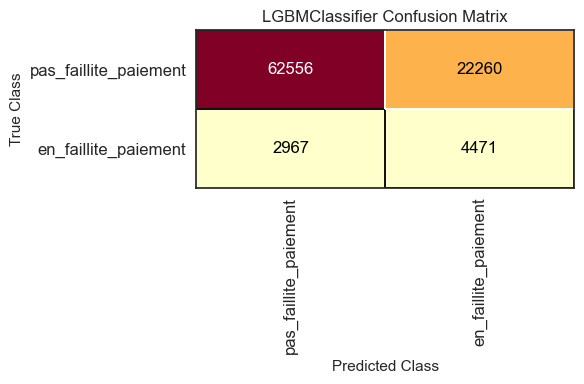

<Axes: title={'center': 'LGBMClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [49]:

classes = ['pas_faillite_paiement', 'en_faillite_paiement']

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

cm = ConfusionMatrix(model_LGBM, classes=classes)

cm.fit(X_train, y_train)        # Fit the visualizer and the model
cm.score(X_val, y_val)        # Evaluate the model on the test data
cm.show()

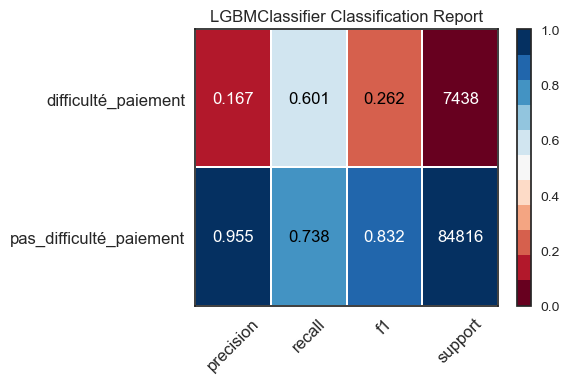

<Axes: title={'center': 'LGBMClassifier Classification Report'}>

In [50]:
# Identifying classes. The classes variable will be useful when using Yellowbrick's visualizers
classes = ['pas_difficulté_paiement', 'difficulté_paiement']

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

visualizer = ClassificationReport(model_LGBM, classes=classes, support=True, cmap='RdBu')

visualizer.fit(X_train, y_train)        # Fit the visualizer and the model
visualizer.score(X_val, y_val)        # Evaluate the model on the test data
visualizer.show()                       # Finalize and show the figure


In [39]:
print(f"Train Accuracy : {accuracy_score(y_train, model_LGBM.predict(X_train)):.2%}")
print(f"Val Accuracy : {accuracy_score(y_val, y_pred):.2%}")

Train Accuracy : 75.75%
Val Accuracy : 72.65%


In [40]:
print(f"Train Precision : {precision_score(y_train, model_LGBM.predict(X_train)):.2%}")
print(f"Val Precision : {precision_score(y_val, y_pred):.2%}")

Train Precision : 22.17%
Val Precision : 16.73%


In [41]:
print(f"Train Recall : {recall_score(y_train, model_LGBM.predict(X_train)):.2%}")
print(f"Val Recall : {recall_score(y_val, y_pred):.2%}")

Train Recall : 79.77%
Val Recall : 60.11%


In [42]:
print(f"Train f1_score : {f1_score(y_train, model_LGBM.predict(X_train)):.2%}")
print(f"Val f1_score : {f1_score(y_val, y_pred):.2%}")

Train f1_score : 34.70%
Val f1_score : 26.17%


In [43]:
print(f"Train f2_score : {fbeta_score(y_train, model_LGBM.predict(X_train), beta=2):.2%}")
print(f"Val f2_score : {fbeta_score(y_val, y_pred, beta=2):.2%}")

Train f2_score : 52.50%
Val f2_score : 39.58%


In [44]:
print(f"Train ROC-AUC : {roc_auc_score(y_train, model_LGBM.predict(X_train)):.2%}")
print(f"Val ROC-AUC : {roc_auc_score(y_val, y_pred):.2%}")

Train ROC-AUC : 77.58%
Val ROC-AUC : 66.93%


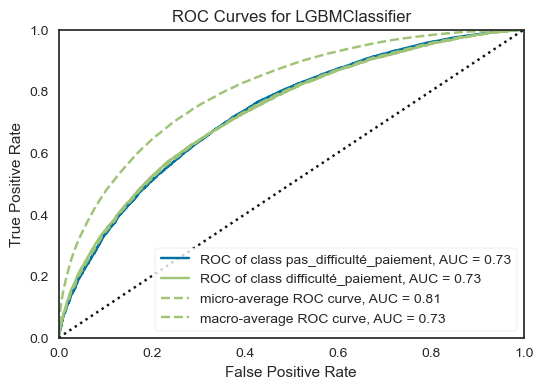

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [45]:

fig, ax = plt.subplots(figsize=(6, 4))

viz_rocauc = ROCAUC(model_LGBM, classes=classes, random_state=101)

viz_rocauc.fit(X_train, y_train)        
viz_rocauc.score(X_val, y_val)
viz_rocauc.show()   

# Interpretability of ML models

A ce stade le modele est en mesure de prédire sur le jeu de données X_test

In [5]:
# je charge les jeu de données d'entrainement avec les données non standardisées ni splittées 

X_train_raw=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\X_train_raw.csv')

# je charge le jeu de test
X_test_raw=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\X_test_raw.csv')


Jeu de données d'entrainement

In [6]:
X_train=X_train_raw.drop(columns=['target','sk_id_curr'],axis=1)
X_train.shape

(307511, 55)

In [7]:
y_train=X_train_raw.target
y_train.shape

(307511,)

Jeu de données de test

In [8]:
X_test=X_test_raw.drop(columns=['sk_id_curr'],axis=1)
X_test.shape

(48744, 55)

In [9]:
X_test_raw.head()

,sk_id_curr,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,anciennete_entreprise,...,name_family_status_seul,name_housing_type_maison_ou_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse identique,reg_city_not_live_city_adresse identique,reg_city_not_work_city_adresse identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,100001,1,0.789654,2,2,1,3,2,4,3,...,0,1,0,0,1,1,1,1,0,0
1,100005,1,0.291656,2,0,0,0,4,3,4,...,0,1,0,0,1,1,1,1,0,0
2,100013,1,0.699787,4,0,3,3,2,4,4,...,0,1,0,0,1,1,1,0,0,1
3,100028,1,0.509677,2,2,4,5,3,2,2,...,0,1,0,1,1,1,1,1,0,0
4,100038,1,0.425687,2,1,3,3,1,1,3,...,0,1,1,0,1,1,0,1,0,0


In [11]:
model_lgbm=LGBMClassifier(objective='binary',class_weight='balanced',boosting_type='gbdt',
                              n_estimators= 500,
                              learning_rate =0.29734997673606356,
                              max_depth= 11,
                              num_leaves= 11,
                              min_data_in_leaf= 200,
                              min_child_samples= 98,
                              lambda_l1=0.9037886944882865,
                              lambda_l2=  0.011906183063897397,
                              reg_alpha= 1.3626718141234433,
                              min_gain_to_split=0.007551036778260303,
                              subsample= 0.2256252562949026,
                              subsample_freq= 2,
                              min_child_weight= 3.6670279307470537,
                              feature_fraction= 0.9658507086246584,
                              bagging_fraction=0.8476232920140797,
                              bagging_freq= 7,
                              max_bin= 232,
                              colsample_bytree= 0.3,
                              random_state=1234,
                              verbose=-1,
                              
                              ) 

model_LGBM=model_lgbm.fit(X_train,y_train) 


In [57]:
# prédictions
target_pred=model_LGBM.predict(X_test)

df_target_pred=pd.DataFrame(target_pred,columns=['y_test_pred'])

In [85]:
print("Prédictions sur l'ensemble de test")
print(pd.DataFrame({
    "COUNT": df_target_pred.value_counts(),
    "RATIO": df_target_pred.value_counts() / len(df_target_pred) * 100}))

Prédictions sur l'ensemble de test
             COUNT      RATIO
y_test_pred                  
0            34881  71.559577
1            13863  28.440423


On peut aussi avoir la probabilité d'appartenir à une catégorie pour chaque individu

In [65]:
X_test.head()

,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,anciennete_entreprise,year_registration,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,1,0.789654,2,2,1,3,2,4,3,2,...,0,1,0,0,1,1,1,1,0,0
1,1,0.291656,2,0,0,0,4,3,4,3,...,0,1,0,0,1,1,1,1,0,0
2,1,0.699787,4,0,3,3,2,4,4,1,...,0,1,0,0,1,1,1,0,0,1
3,1,0.509677,2,2,4,5,3,2,2,0,...,0,1,0,1,1,1,1,1,0,0
4,1,0.425687,2,1,3,3,1,1,3,1,...,0,1,1,0,1,1,0,1,0,0


In [88]:
##identifiant 100001
target_proba = model_LGBM.predict_proba(X_test.loc[X_test.index==0])

target_proba

array([[0.94139242, 0.05860758]])

In [60]:
df_target_proba=pd.DataFrame(target_proba,columns=['classe_0_proba','classe_1_proba'])
df_target_proba=pd.concat([X_test_raw['sk_id_curr'],df_target_proba['classe_1_proba']], axis=1)

In [61]:
df_target_proba.head()

,sk_id_curr,classe_1_proba
0,100001,0.058608
1,100005,0.433296
2,100013,0.111126
3,100028,0.542976
4,100038,0.591936


In [25]:
df_target_proba[df_target_proba['classe_1_proba']>0.8].sort_values(by='classe_1_proba',ascending=False)

,sk_id_curr,classe_1_proba
14462,204235,0.973553
2764,119362,0.969966
21153,253499,0.967733
3100,121772,0.961443
30530,321936,0.961276
...,...,...
14027,201368,0.800254
26883,295904,0.800141
44826,428228,0.800119
28721,309476,0.800047


# Global Interpretability

### Features importance

Avec la fonction feature_importances_ , on peut avoir une valeur qui reflète l'importance de chaque variable.  
Avec plot_importance , on trace le graphique avec les variables et les valeurs de coéfficient d'importance

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

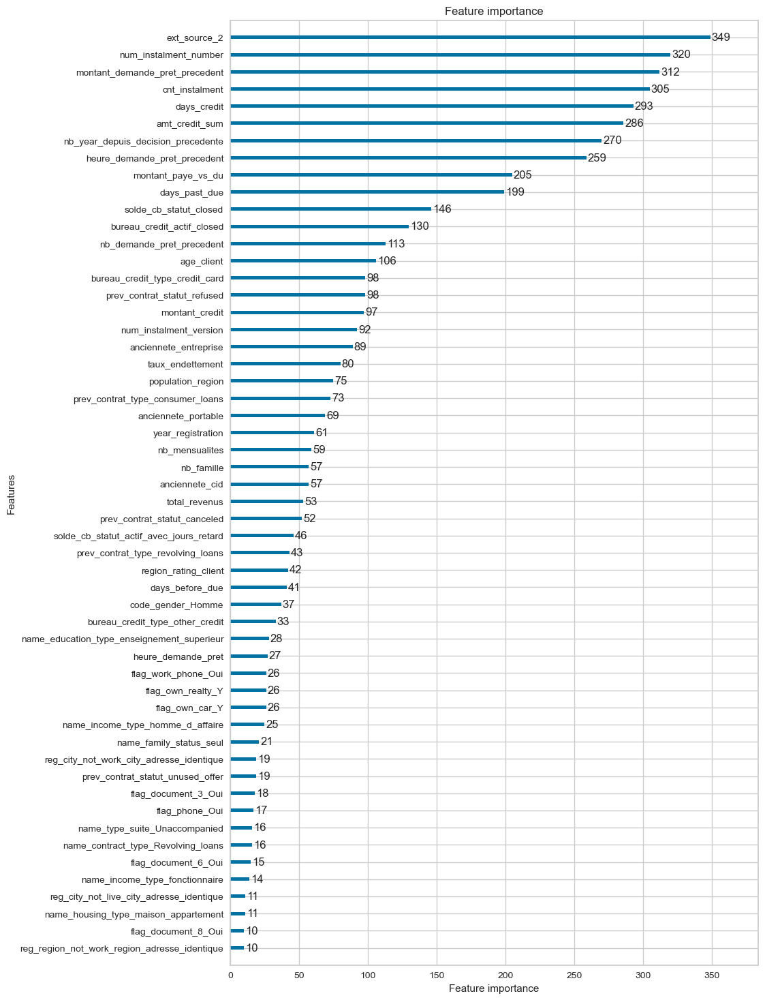

In [26]:
coef_imp_feature = pd.DataFrame({'variable': X_test.columns,
                                 'coef': model_LGBM.feature_importances_})
# affiche l'importance de la caractéristique avec plot_importance 
plot_importance(model_LGBM,figsize=(10,18))

In [27]:
## rapide analyse descriptive 
coef_imp_feature.describe().T

,count,mean,std,min,25%,50%,75%,max
coef,55.0,90.909091,97.658944,0.0,23.0,53.0,102.0,349.0


Avec ce graphique , on ne peut pas connaître l'impact d'une augmentation de ext_source_2 par exemple sur la sortie.
Par contre avec le summary_plot de SHAP,on a à la fois une interprétabilité globale du modèle et une interprétabilité locale de chaque individu

In [28]:
# Récupération des shap_values par le paramètre `pred_contrib` de la fonction predict de LGBM
shap_values_lgbm =  model_LGBM.predict(X_test, pred_contrib=True)

shap_values_lgbm

array([[-9.35901705e-03, -1.53423886e+00, -4.83502180e-03, ...,
        -3.95322155e-03,  8.79353070e-05, -6.09879696e-01],
       [ 1.04751718e-02,  3.91014502e-01,  2.94706483e-02, ...,
        -2.89780839e-03, -9.58790841e-04, -6.09879696e-01],
       [-3.45427671e-03, -3.98227546e-01,  1.80788078e-02, ...,
        -1.02693162e-03, -4.39641545e-02, -6.09879696e-01],
       ...,
       [-9.77533680e-03, -2.08010087e-01,  1.44875698e-02, ...,
        -1.03161981e-02, -6.21041357e-03, -6.09879696e-01],
       [ 4.90896032e-03,  1.86356615e-01, -5.90760416e-02, ...,
        -1.10075877e-02, -2.45488007e-03, -6.09879696e-01],
       [-1.10082207e-02,  2.08205397e-01, -1.04379172e-02, ...,
        -7.91715528e-03, -4.28451549e-03, -6.09879696e-01]])

### SHapley Additive exPlanations (SHAP)

In [29]:
 shap.initjs()

Cette technique permet d’expliquer les prédictions des modèles de Machine Learning de manière compréhensible aux humains. En attribuant une valeur à chaque caractéristique entrée, il montre comment et dans quelle mesure chaque caractéristique a contribué au résultat final de la prédiction.
Il explique comment le modèle a pris sa décision et permet d'identifier les caractéristiques les plus importantes.
Il fait cela en calculant la contribution moyenne de chaque caractéristique à la prédiction sur toutes les combinaisons possibles de caractéristiques.

Quelques termes en relation avec l'interpretabilité des modèles: 

    .Explicabilité: possibilité d’expliquer d’un point de vue technique la prédiction d’un algorithme.

    .Interprétabilité: capacité d’expliquer ou de fournir du sens en termes compréhensibles par un être humain.

    .Transparence: un modèle est considéré comme transparent s’il est compréhensible en soi.
    
    .Explications globales : explications concernant le fonctionnement du modèle de point de vue général. Quelles caractéristiques affectent le comportement général d’un modèle d’allocation de crédit ?

    .Explications locales : explications du modèle pour une instance. Pourquoi la demande de prêt d’un client a-t-elle été approuvée ou refusée ?

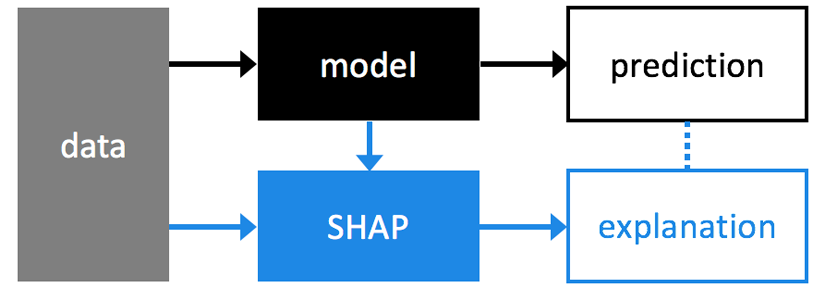

Les shap_values représentent la contribution de chaque caractéristique à la prédiction faite par le modèle pour chaque instance du dataset .

In [30]:
# expliquer le modele
explainer = shap.TreeExplainer(model_LGBM)
shap_values = explainer(X_test)

In [31]:
# on affiche une valeur de référence avec base_values
print(f"Valeur de Référence moyenne : {shap_values.base_values[0]}")

Valeur de Référence moyenne : [ 0.6098797 -0.6098797]


Pour les valeurs SHAP seules on utilise explainer.shap_values()

In [32]:
#On affiche toutes les shap_values des 2 classes
shap_values = explainer.shap_values(X_test)
shap_values

[array([[ 9.35901705e-03,  1.53423886e+00,  4.83502180e-03, ...,
         -2.30200040e-02,  3.95322155e-03, -8.79353070e-05],
        [-1.04751718e-02, -3.91014502e-01, -2.94706483e-02, ...,
         -4.44818434e-02,  2.89780839e-03,  9.58790841e-04],
        [ 3.45427671e-03,  3.98227546e-01, -1.80788078e-02, ...,
          1.93693716e-01,  1.02693162e-03,  4.39641545e-02],
        ...,
        [ 9.77533680e-03,  2.08010087e-01, -1.44875698e-02, ...,
         -6.02334785e-02,  1.03161981e-02,  6.21041357e-03],
        [-4.90896032e-03, -1.86356615e-01,  5.90760416e-02, ...,
         -5.83377300e-02,  1.10075877e-02,  2.45488007e-03],
        [ 1.10082207e-02, -2.08205397e-01,  1.04379172e-02, ...,
         -5.39693716e-02,  7.91715528e-03,  4.28451549e-03]]),
 array([[-9.35901705e-03, -1.53423886e+00, -4.83502180e-03, ...,
          2.30200040e-02, -3.95322155e-03,  8.79353070e-05],
        [ 1.04751718e-02,  3.91014502e-01,  2.94706483e-02, ...,
          4.44818434e-02, -2.89780839e

In [33]:
#On peut afficher  les shap_values de la classe 1
shap_values[1]

array([[-9.35901705e-03, -1.53423886e+00, -4.83502180e-03, ...,
         2.30200040e-02, -3.95322155e-03,  8.79353070e-05],
       [ 1.04751718e-02,  3.91014502e-01,  2.94706483e-02, ...,
         4.44818434e-02, -2.89780839e-03, -9.58790841e-04],
       [-3.45427671e-03, -3.98227546e-01,  1.80788078e-02, ...,
        -1.93693716e-01, -1.02693162e-03, -4.39641545e-02],
       ...,
       [-9.77533680e-03, -2.08010087e-01,  1.44875698e-02, ...,
         6.02334785e-02, -1.03161981e-02, -6.21041357e-03],
       [ 4.90896032e-03,  1.86356615e-01, -5.90760416e-02, ...,
         5.83377300e-02, -1.10075877e-02, -2.45488007e-03],
       [-1.10082207e-02,  2.08205397e-01, -1.04379172e-02, ...,
         5.39693716e-02, -7.91715528e-03, -4.28451549e-03]])

In [34]:
df_shape_values=pd.DataFrame(data=shap_values[1],columns=X_test.columns)

In [35]:
df_shape_values.head()

,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,anciennete_entreprise,year_registration,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,-0.009359,-1.534239,-0.004835,-0.063281,-0.031738,0.166503,0.034118,-0.208978,-0.031225,0.024128,...,-0.053724,-0.006301,-0.021995,0.047716,-0.000728,-0.019082,-0.014587,0.023020,-0.003953,0.000088
1,0.010475,0.391015,0.029471,-0.004150,0.056598,-0.424041,0.026376,-0.023413,-0.205082,-0.064766,...,-0.048292,-0.006107,-0.038118,0.028086,-0.001719,-0.013122,-0.011270,0.044482,-0.002898,-0.000959
2,-0.003454,-0.398228,0.018079,0.058624,-0.069240,0.132703,0.064506,-0.107974,-0.222534,0.029997,...,-0.054800,-0.006152,-0.033218,0.019957,0.000831,-0.014931,-0.006648,-0.193694,-0.001027,-0.043964
3,0.004627,0.098292,0.008777,-0.073236,-0.031697,0.064487,0.065354,0.179107,0.091484,-0.112729,...,-0.025344,-0.012146,-0.009015,-0.023498,0.007897,-0.011317,-0.015367,0.021242,0.000663,0.000669
4,-0.004848,0.200050,-0.006745,0.137638,0.051568,0.129714,0.011237,0.153155,-0.063975,0.028325,...,-0.036773,-0.003714,0.091080,0.033258,0.001547,-0.012888,0.005735,0.078163,-0.006174,-0.003090


In [66]:
print("Moyenne des valeurs absolues des valeurs de Shap :\n", df_shape_values.abs().mean().sort_values(ascending=False))

Moyenne des valeurs absolues des valeurs de Shap :
 ext_source_2                                    0.335264
days_credit                                     0.221906
montant_paye_vs_du                              0.207095
code_gender_Homme                               0.199178
prev_contrat_statut_refused                     0.194713
cnt_instalment                                  0.187887
montant_credit                                  0.159220
age_client                                      0.156613
solde_cb_statut_closed                          0.143845
name_education_type_enseignement_superieur      0.136773
num_instalment_number                           0.136015
anciennete_entreprise                           0.126508
bureau_credit_type_credit_card                  0.122199
montant_demande_pret_precedent                  0.103260
bureau_credit_actif_closed                      0.101925
solde_cb_statut_actif_avec_jours_retard         0.098323
amt_credit_sum                      

In [67]:
print(f"Moyenne générale des valeurs absolues des valeurs de Shap : {df_shape_values.abs().mean().mean():.2f}")

Moyenne générale des valeurs absolues des valeurs de Shap : 0.08


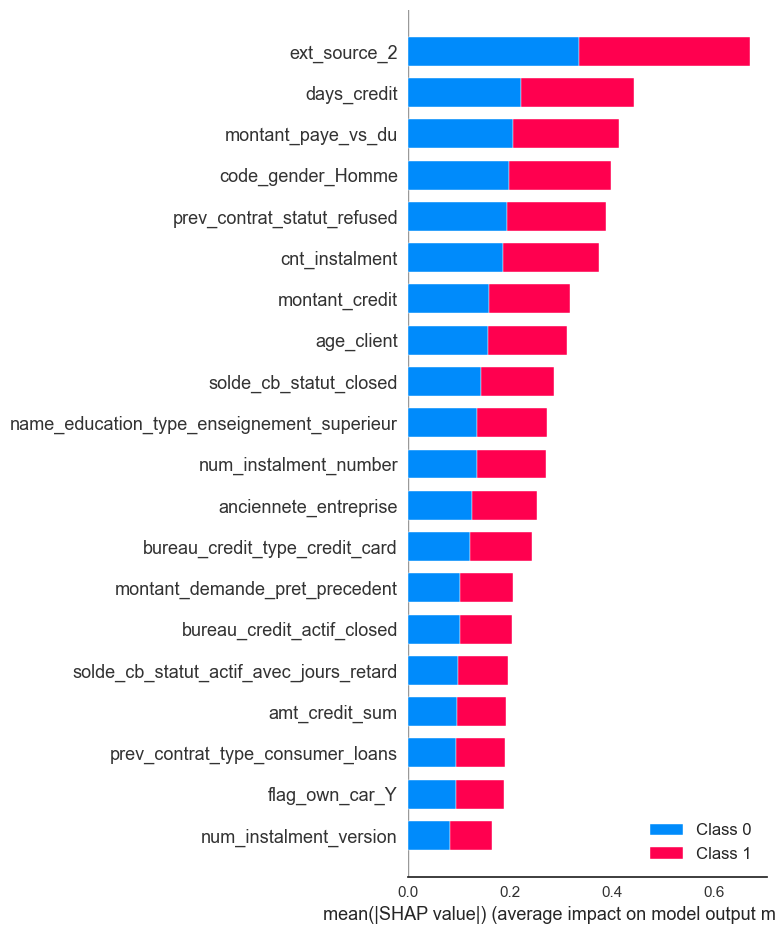

In [68]:
shap.summary_plot(shap_values, X_test)

On peut regarder l'importance de chaque caractéristique pour la classe 1

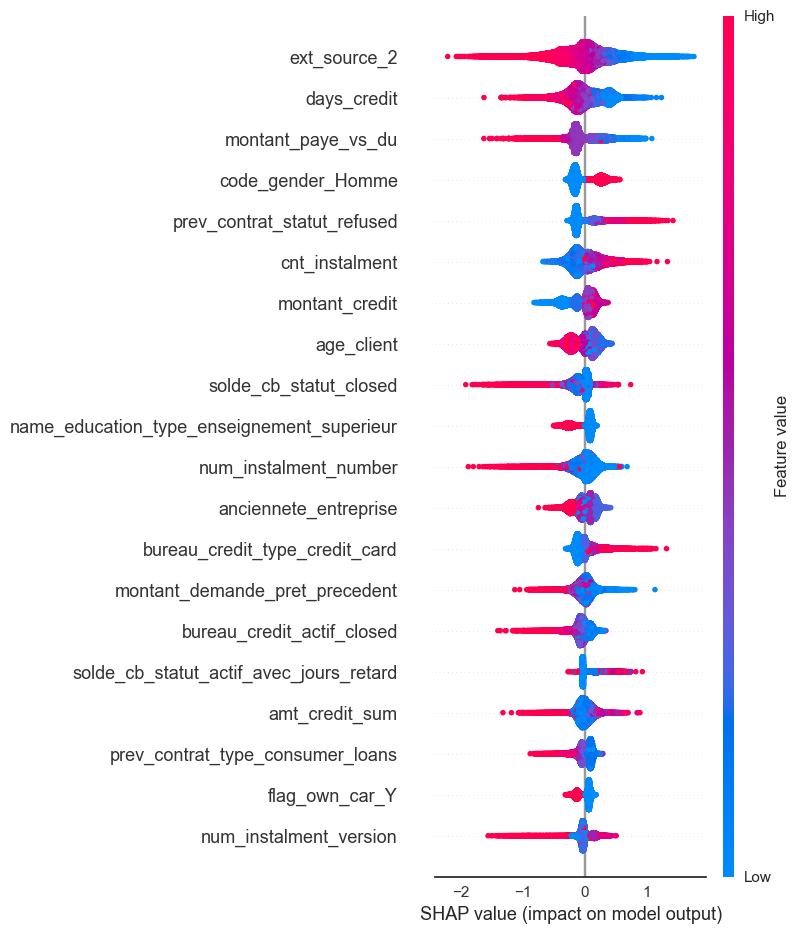

In [69]:
shap.summary_plot(shap_values[1], X_test)

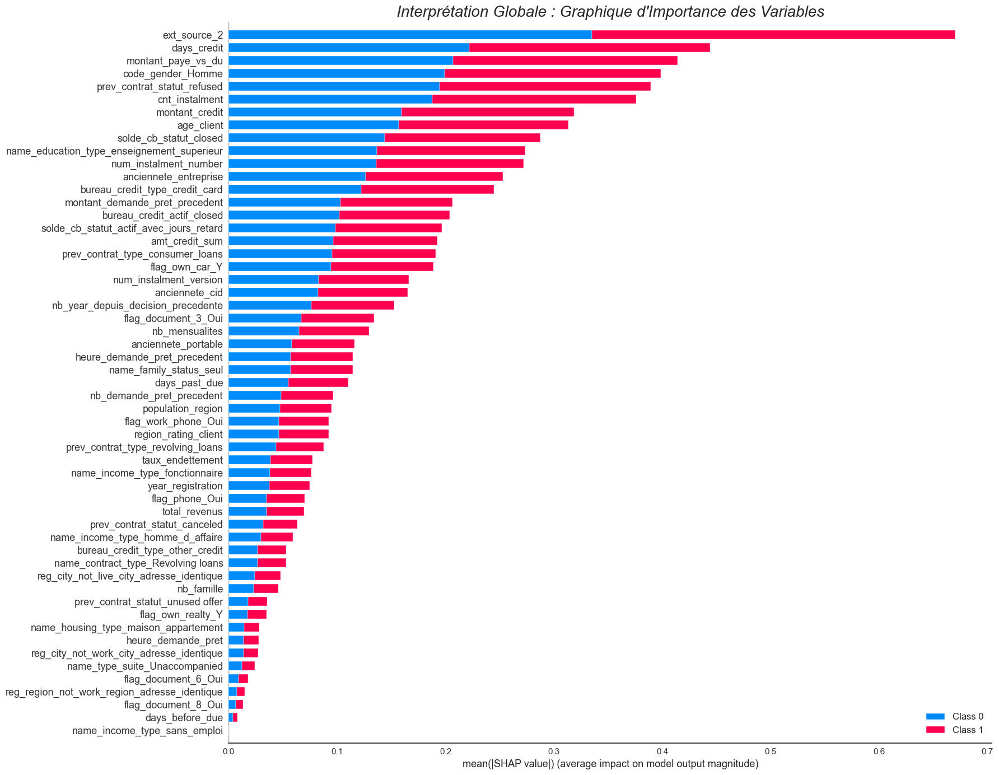

In [70]:
#affichage complet de l'importance des 55 caractéristiques
shap.summary_plot(shap_values, 
                  feature_names=X_test.columns,
                  plot_size=(18, 14),
                  plot_type="bar",
                  max_display=55,
                  show = False)
plt.title("Interprétation Globale : Graphique d'Importance des Variables", fontsize=20, fontstyle='italic')
plt.tight_layout()
plt.show()


On peut réduire en fixant un seuil >= 0.1 et focaliser l'analyse sur ces caractéristiques

In [71]:
df_shape_values.abs().mean().loc[df_shape_values.abs().mean() >0.1].count()

15

Il y a 15 variables dont l'importance est >= 0.1

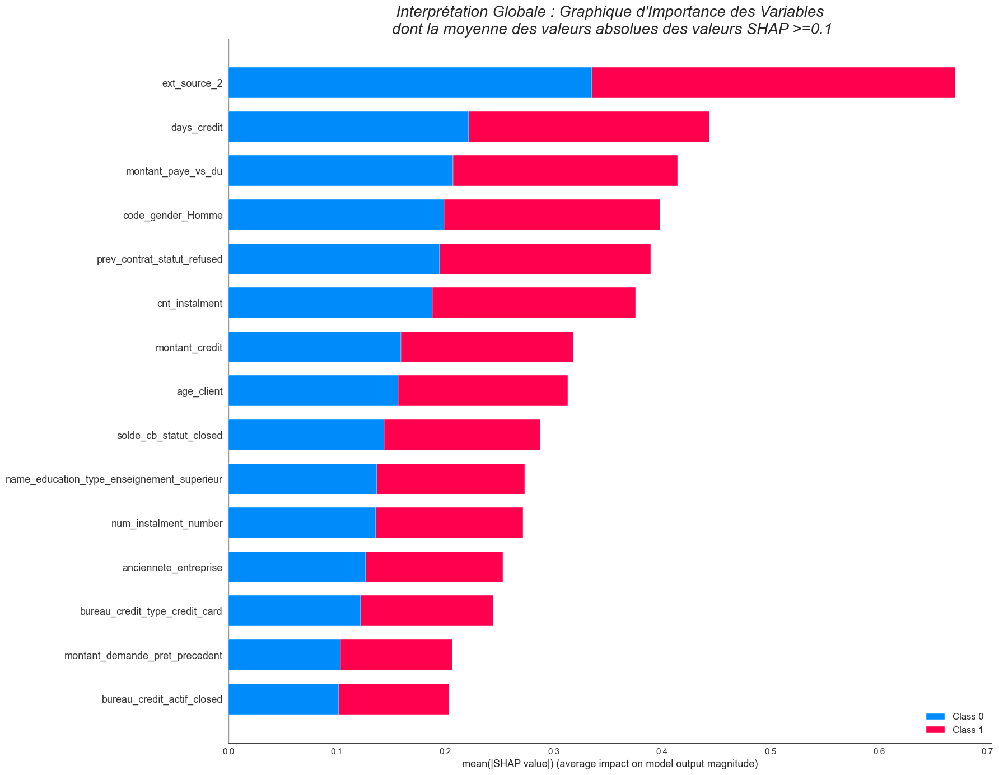

In [72]:
#affichage  des 15 variables les plus importantes
shap.summary_plot(shap_values, 
                  feature_names=X_test.columns,
                  plot_size=(18, 14),
                  plot_type="bar",
                  max_display=15,
                  show = False)
plt.title("Interprétation Globale : Graphique d'Importance des Variables\n dont la moyenne des valeurs absolues des valeurs SHAP >=0.1", fontsize=20, fontstyle='italic')
plt.tight_layout()
plt.show()


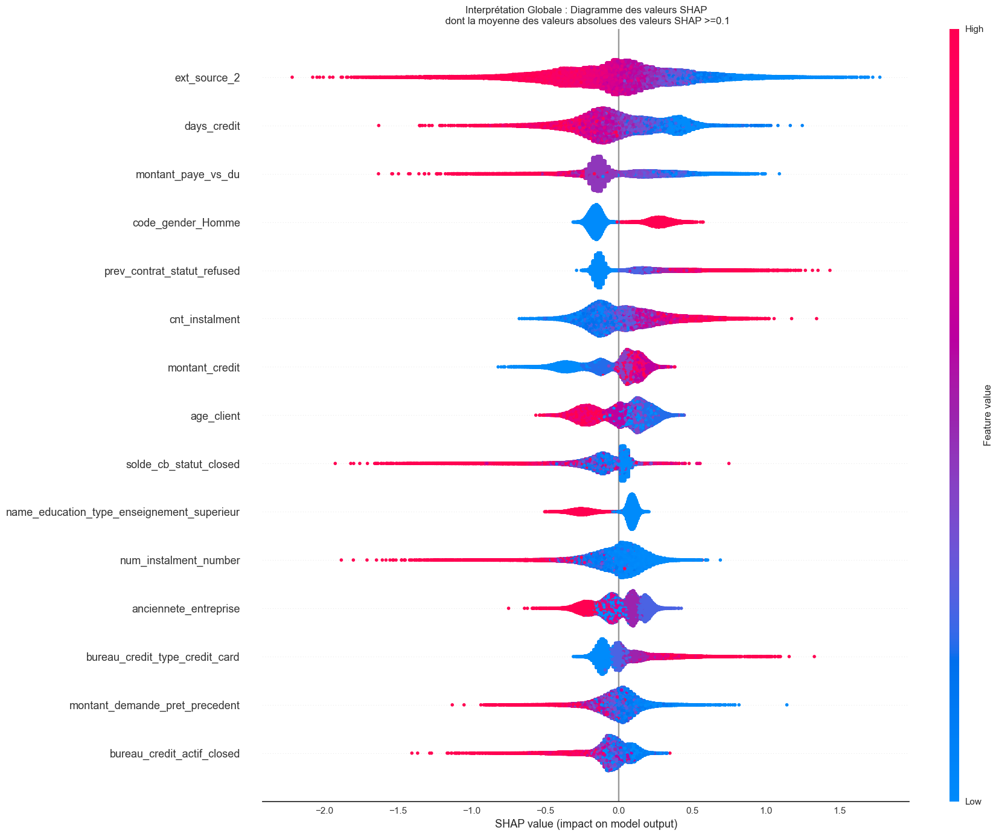

In [73]:
# représentation des points
shap.initjs()

shap.summary_plot(shap_values[1], 
                  features=X_test,
                  feature_names=X_test.columns,
                  plot_size=(18, 14),
                  plot_type="dot",
                  max_display=15,
                  show = False)
plt.title("Interprétation Globale : Diagramme des valeurs SHAP\n dont la moyenne des valeurs absolues des valeurs SHAP >=0.1")
plt.tight_layout()
plt.show()

### Impact of each characteristic on the model

#### ext_source_2 :Score normalisé à partir de source de données externe 

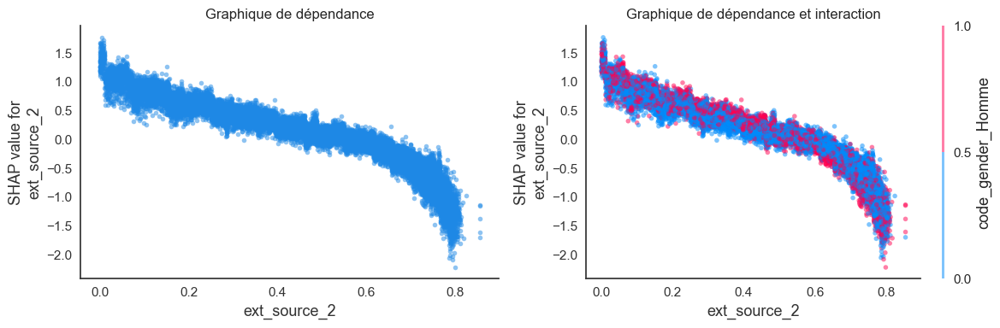

In [74]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("ext_source_2", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("ext_source_2", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus la valeur de la variable ext_source_2 est faible (points de couleur bleue), et plus la valeur Shap est élevée et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### days_credit : De Combien d'années date la dernière demande de crédit du client avant la demande en cours ?
valeur transformée en années

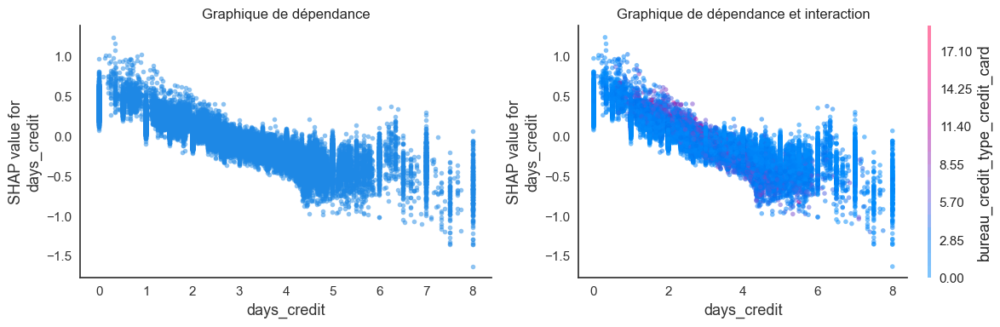

In [75]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("days_credit", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("days_credit", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus la dernière demande de crédit est récente ,plus la valeur SHAP est élevée et donc plus le modèle prédit qu'il aura des difficultés de paiements

####  montant_paye_vs_du : Le client a-t-il remboursé toutes les mensualités attendues des prêts précédents ?

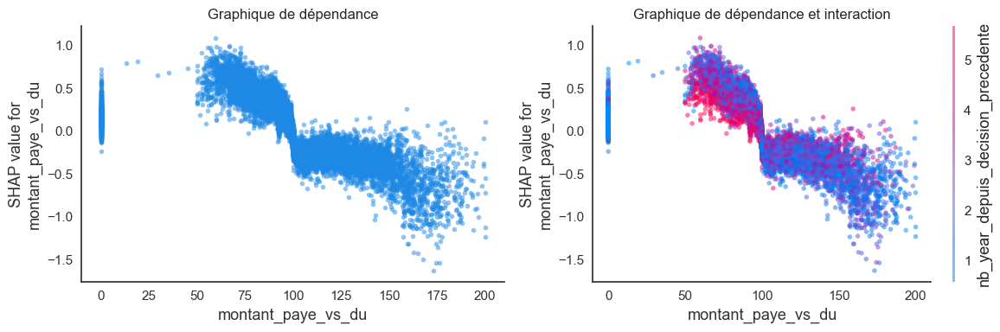

In [76]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("montant_paye_vs_du", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("montant_paye_vs_du", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus le montant remboursé par le client est faible par rapport au montant attendu , plus la valeur SHAP augmente et donc plus le modèle prédit qu'il aura des difficultés de paiements.

####  code_gender_Homme : Quel est le genre du client ?

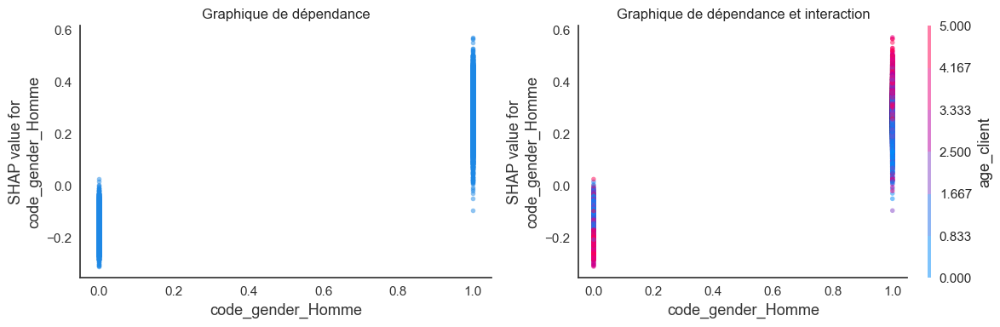

In [77]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("code_gender_Homme", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("code_gender_Homme", shap_values[1], X_test,
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

lorsque le client est un homme, la valeur SHAP est plus élevée et le modele prédit que plus la valeur SHAP est élevée,plus le client aura des difficultés de paiement

#### cnt_instalment : durée mensuelle du crédit précédent

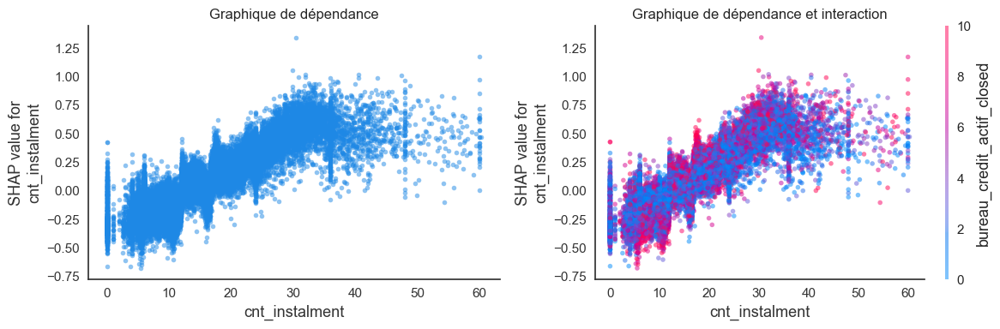

In [78]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("cnt_instalment", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("cnt_instalment", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus la durée du crédit précédent est importante , plus la valeur SHAP augmente et donc plus le modèle prédit que le client aura des difficulté de paiement

#### num_instalment_number: nombre de versements effectués par le client

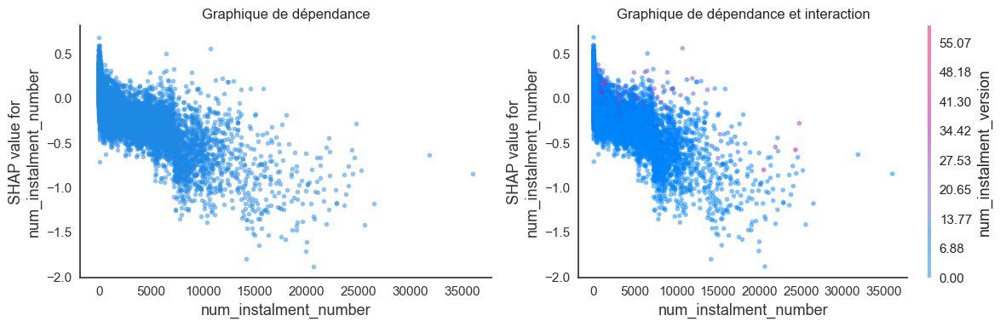

In [79]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("num_instalment_number", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("num_instalment_number", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus le nombre de versements effectués par la client est faible , plus la valeur SHAP est importante et donc plus le modèle prédit qu'il aura des difficultés de paiement.

#### prev_contrat_statut_refused : nombre de contrats précédents refusés pour le client

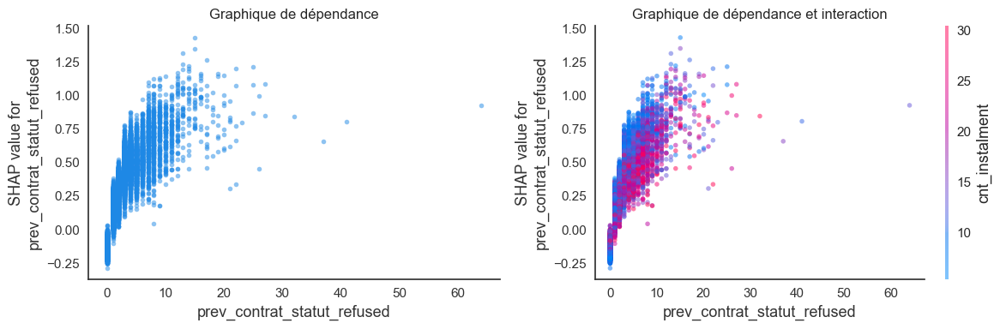

In [80]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("prev_contrat_statut_refused", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("prev_contrat_statut_refused", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus le nombre de contrats précédents refusés est important plus la valeur SHAP est élevée et plus le modèle prédit que le client aura des difficultés de paiement

#### amt_credit_sum : Montant actuel du crédit enregistré au bureau de crédit 

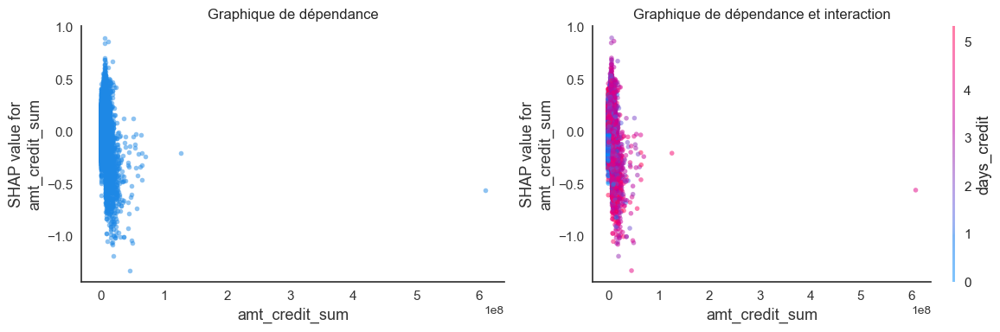

In [81]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("amt_credit_sum", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("amt_credit_sum", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus le montant du credit actuel enregistré au bureau de crédit est faible,plus la valeur SHAP est importante et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### age_client

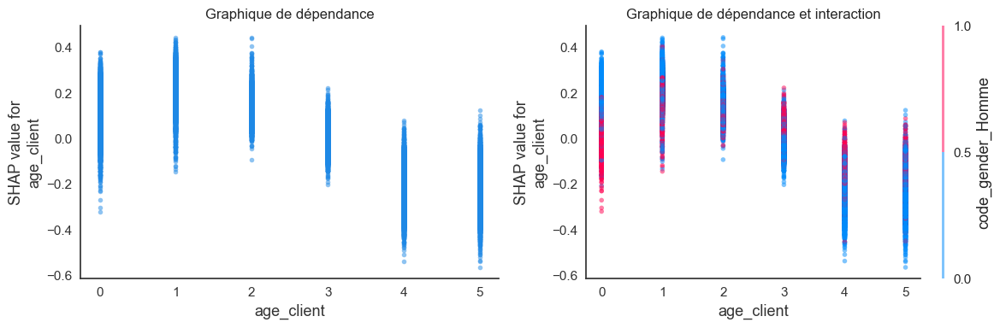

In [82]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("age_client", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("age_client", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus l'âge du client est faible , plus la valeur SHAP est élevée et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### anciennete_entreprise

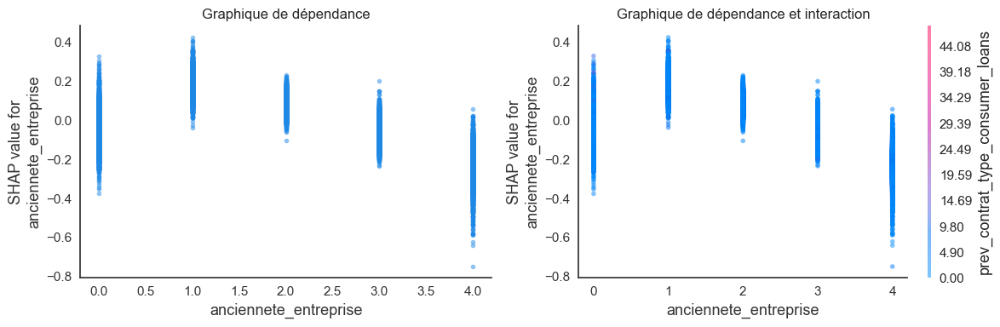

In [83]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("anciennete_entreprise", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("anciennete_entreprise", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus l'ancienneté du client dans l'entreprise est faible , plus la valeur SHAP est élevée et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### montant_demande_pret_precedent : montant de la demande de prêt précédente

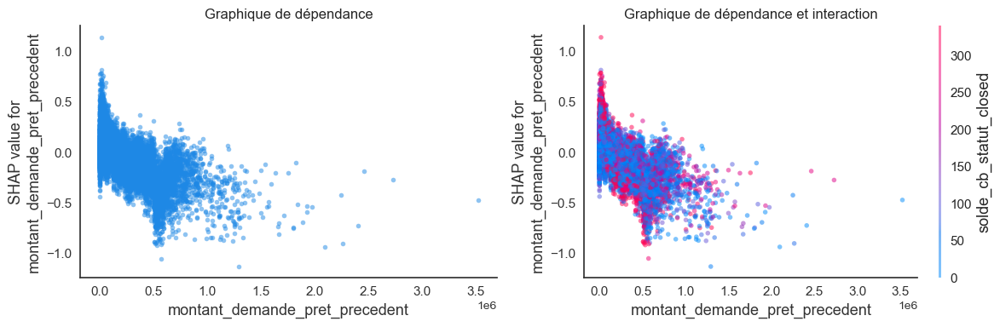

In [84]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("montant_demande_pret_precedent", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("montant_demande_pret_precedent", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus le montant de la demande de prêt précédente est faible,plus la valeur SHAP est importante et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### name_education_type_enseignement_superieur : Le client a t-il suivi des études dans l'enseignement supérieur ?

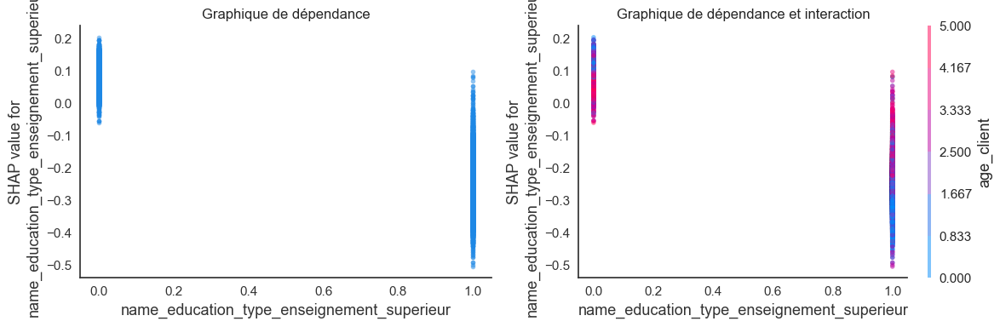

In [85]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("name_education_type_enseignement_superieur", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("name_education_type_enseignement_superieur", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Pour Les clients qui n'ont pas suivi l'enseignement supérieur, la valeur SHAP est importante  et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### montant_credit : montant du crédit demandé par le client

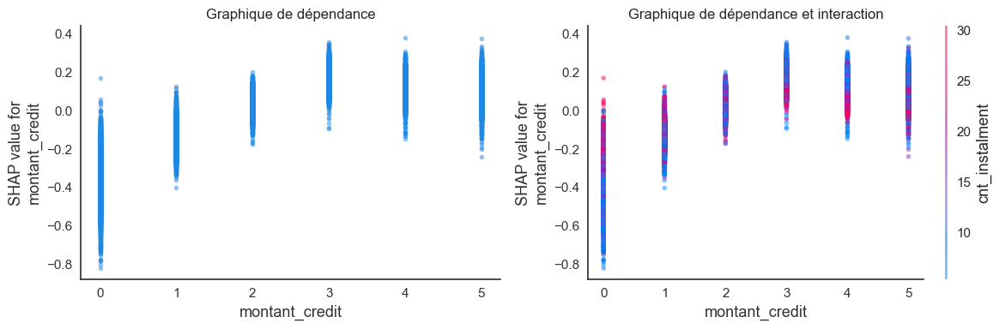

In [86]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("montant_credit", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("montant_credit", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus le montant du crédit demandé est important ,plus la valeur SHAP est élevée et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### bureau_credit_type_credit_card : nombre de cartes de crédit du client enregistré au bureau des crédits

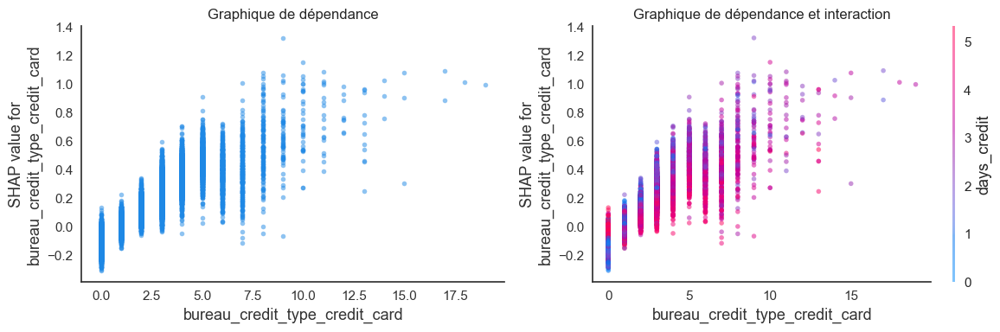

In [87]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("bureau_credit_type_credit_card", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("bureau_credit_type_credit_card", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

Plus le nombre de cartes de crédit du client enregistrées au bureau des crédits est important ,plus la valeur SHAP est élevée et donc plus le modèle prédit que le client aura des difficultés de paiement.

#### solde_cb_statut_closed :Est-ce que les crédits enregistrés au  Bureau des Crédits ont le statut closed?

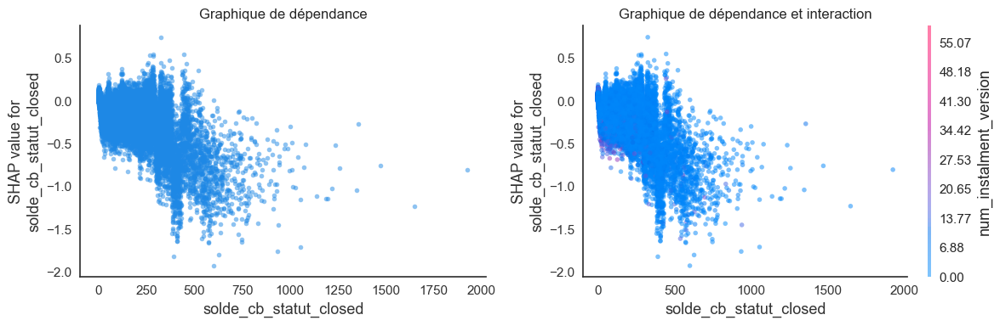

In [88]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("solde_cb_statut_closed", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("solde_cb_statut_closed", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

#### bureau_credit_actif_closed:les précédents crédits inscrits au bureau des crédits ont été remboursés ?

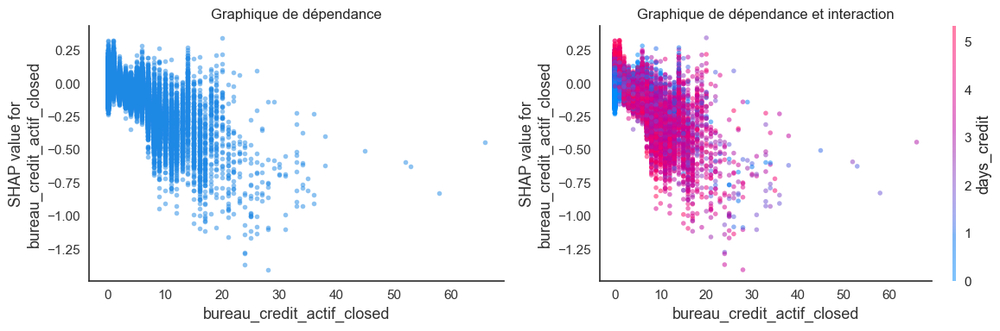

In [89]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("bureau_credit_actif_closed", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5, 
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("bureau_credit_actif_closed", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et interaction" )

plt.tight_layout()
plt.show()

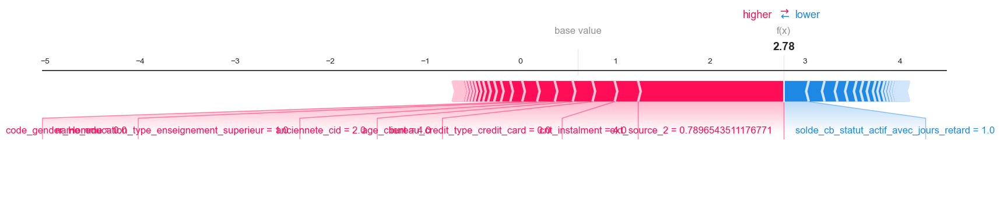

In [90]:
shap.plots.force(explainer.expected_value[0], shap_values[0][0,:], X_test.iloc[0, :], matplotlib = True)

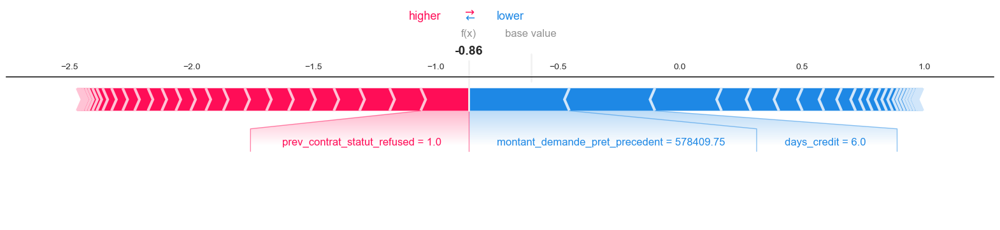

In [91]:
shap.plots.force(explainer.expected_value[1], shap_values[1][20, :], X_test.iloc[20, :],matplotlib = True)

In [92]:
shap.initjs()

shap.force_plot(explainer.expected_value[1], shap_values[1][:1000,:], X_test.iloc[:1000,:])

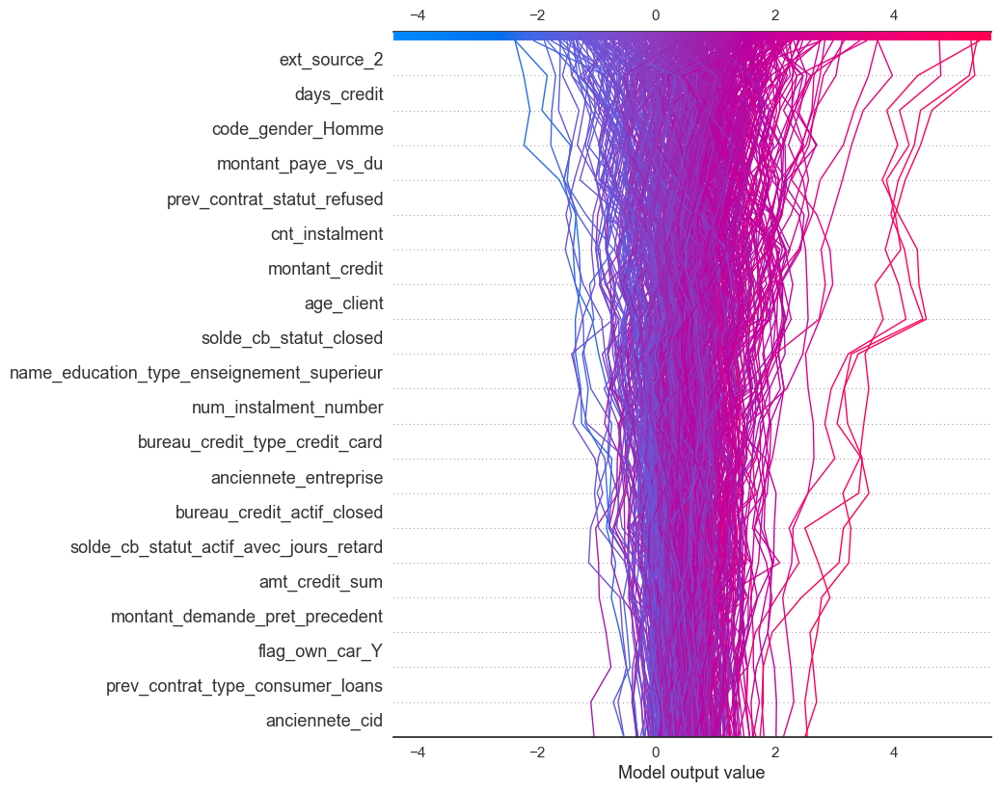

In [93]:
shap.decision_plot(explainer.expected_value[0], shap_values[0][:500,:], X_test.iloc[:500,:])

## Local Interpretability 

### Quel est le pourcentage de risque que le client ait des difficultés de paiement si on lui octroie le crédit ?

In [94]:
explainer_shap = shap.TreeExplainer(model_LGBM)
shap_values = explainer_shap.shap_values(X_test)

 On utilisera le fichier **X_test_raw** qui contient  le numéro de client "sk_id_curr".


In [80]:
# load JS visualization code to notebook
shap.initjs()

idx =4
print("Identifiant du Client : ", X_test_raw.iloc[idx, 0])
print("Model Prediction : Classe", target_pred[idx])
print(f"Il y a {target_proba[idx][1]:.1%} de risques que le client ait des difficultés de paiement")
print("**"*40)
shap.force_plot(explainer.expected_value[1], 
                shap_values[1][idx,:], 
                X_test.iloc[idx,:], 
                link='logit',
                figsize=(20, 8),
                ordering_keys=True,
                text_rotation=30,
                contribution_threshold=0.05)

Identifiant du Client :  100038
Model Prediction : Classe 1
Il y a 59.2% de risques que le client ait des difficultés de paiement
********************************************************************************


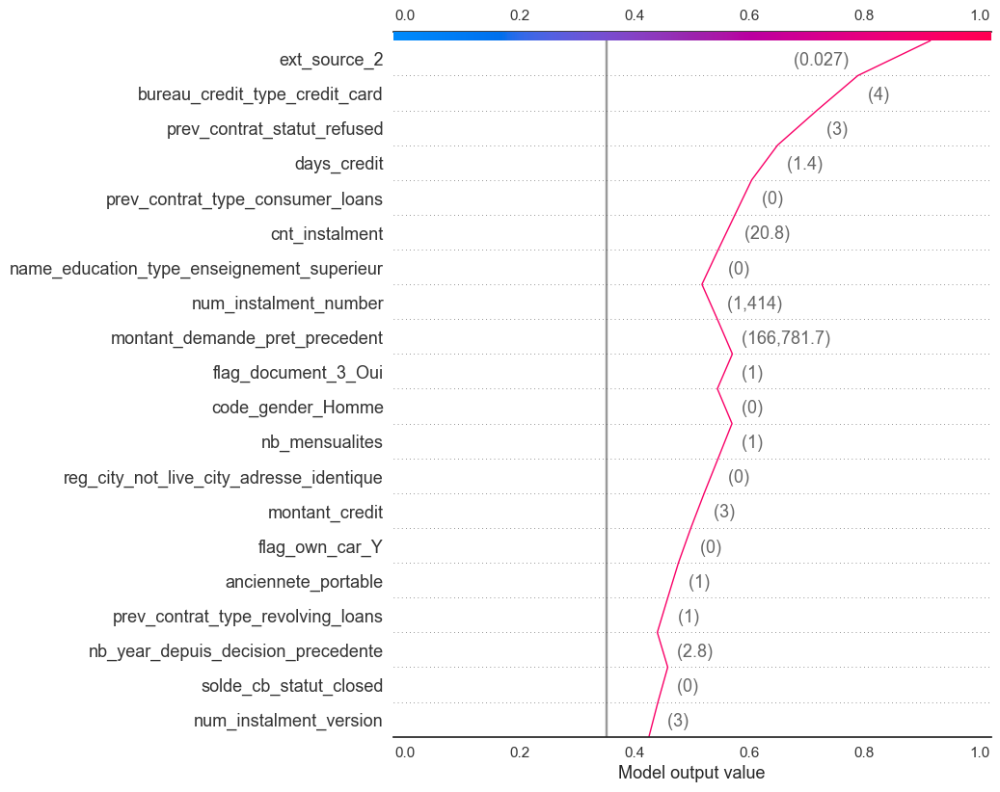

In [96]:
shap.decision_plot(explainer.expected_value[1], 
                   shap_values[1][idx,:], 
                   X_test.iloc[idx,:], 
                   feature_names=X_test.columns.to_list(),
                   feature_order='importance',
                                      link='logit')

### Local Interpretable Modele agnostic Explanations (LIME)

LIME est une technique qui permet de créer un modèle simple autour de la prédiction que nous voulons expliquer et d'utiliser ce modele pour expliquer la prédiction.
En pratique, pour une **prédiction donnée** , LIME va pertuber les entrées de la prédictions et regarder comment la pertubation a affécté la sortie du modèle. Les attributs qui affectent le plus la sortie lorsqu'ils sont pertubés sont considérés comme ayant une importance élevée pour **cette prédiction** .  
On est dans de **l'INTERPRETABILITE LOCALE**

In [12]:
explainer_lime=lime_tabular.LimeTabularExplainer(X_test_raw.iloc[:,1:].values,feature_names=X_test_raw.iloc[:,1:].columns.values.tolist(),
                                            class_names=["pas_faillite_paiement","en_faillite_paiement"],
                                            verbose=True,
                                            mode="classification")

# choisir un individu
idx =0

expl=explainer_lime.explain_instance(X_test_raw.iloc[:,1:].iloc[idx,:],model_LGBM.predict_proba,num_features=15)

# afficher l'explication
print("identifiant client :", X_test_raw.iloc[idx, 0])
expl.show_in_notebook(show_table=True)

Intercept 0.49169815864535676
Prediction_local [0.23091962]
Right: 0.037825576545315216
identifiant client : 100001


Les 2 techniques donnent des résultats très similaires. LIME est indépendant du modèle et fournit des explications locales et interprétables, tandis que SHAP est spécifique au modèle et fournit des explications globales en utilisant une approche basée sur la théorie des jeux.

### Constitution de groupes de clients selon leur probabilité de défaut de paiement

on utilise le dataframe df_shap_values contenant des valeurs shap auquel on ajoute la colonne contenant la probabilité d'appartenir à la classe 1. Pour cela on fait une concaténation avec la colonne classe_1_proba du dataframe df_target_proba

In [38]:
df_work = pd.concat([df_target_proba['classe_1_proba'], df_shape_values], axis=1)
df_work.shape

(48744, 56)

In [39]:
df_work.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 56 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   classe_1_proba                                48744 non-null  float64
 1   region_rating_client                          48744 non-null  float64
 2   ext_source_2                                  48744 non-null  float64
 3   taux_endettement                              48744 non-null  float64
 4   nb_mensualites                                48744 non-null  float64
 5   total_revenus                                 48744 non-null  float64
 6   montant_credit                                48744 non-null  float64
 7   population_region                             48744 non-null  float64
 8   age_client                                    48744 non-null  float64
 9   anciennete_entreprise                         48744 non-null 

Nous devons créer des groupes contenant un nombre d'instances identique. Commencons par regarder la distribution.

In [40]:
df_work.classe_1_proba.describe()

count    48744.000000
mean         0.371035
std          0.214576
min          0.001294
25%          0.195663
50%          0.345660
75%          0.528171
max          0.973553
Name: classe_1_proba, dtype: float64

<Axes: >

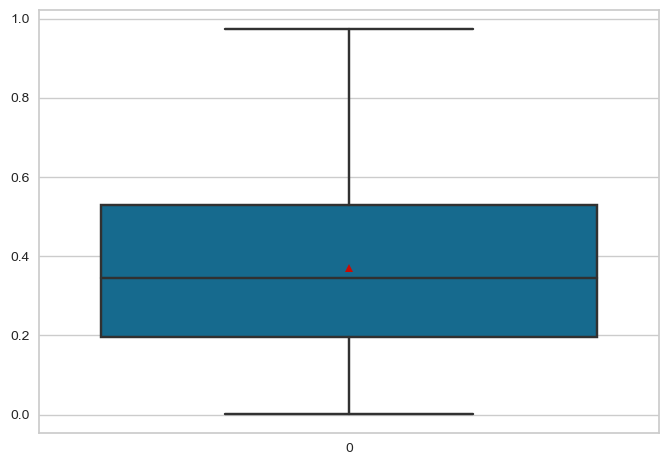

In [41]:
sns.boxplot(df_work.classe_1_proba,showmeans=True)

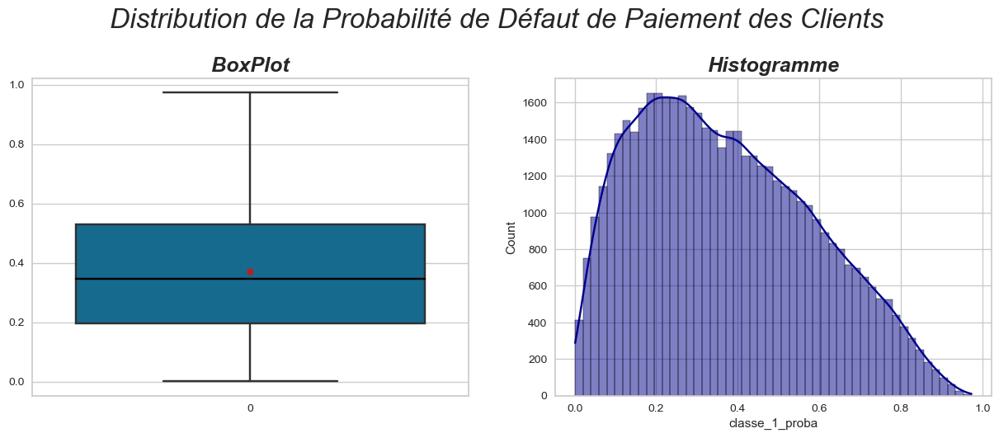

In [42]:


plt.figure(figsize = (15, 5))


plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot(df_work.classe_1_proba, showfliers=True, medianprops=medianprops,
                         showmeans=True, meanprops=meanprops)
plt.title("BoxPlot", loc="center", fontsize=18,
          fontstyle='italic', fontweight="bold")
plt.subplot(1,2,2)
sns.histplot(data=df_work, x='classe_1_proba',kde=True, bins=50, color='Darkblue')
plt.title("Histogramme", loc="center", fontsize=18,
          fontstyle='italic', fontweight="bold")

plt.suptitle("Distribution de la Probabilité de Défaut de Paiement des Clients\n",
             y=1.05, fontsize=24, fontstyle='italic')

plt.show()


In [43]:
pd.qcut(df_work['classe_1_proba'], precision=1, q=4).head(5)

0    (-0.099, 0.2]
1       (0.3, 0.5]
2    (-0.099, 0.2]
3       (0.5, 1.0]
4       (0.5, 1.0]
Name: classe_1_proba, dtype: category
Categories (4, interval[float64, right]): [(-0.099, 0.2] < (0.2, 0.3] < (0.3, 0.5] < (0.5, 1.0]]

In [44]:
labels = ['20% ou moins',"de_21_à_30%","de_31_à_50%","51%_ou plus"]
df_work.insert(0, 'segmentation_risque'," ")
df_work['segmentation_risque']= pd.qcut(df_work.classe_1_proba, q=4, labels=labels)
df_work['segmentation_risque'].value_counts()

20% ou moins    12186
de_21_à_30%     12186
de_31_à_50%     12186
51%_ou plus     12186
Name: segmentation_risque, dtype: int64

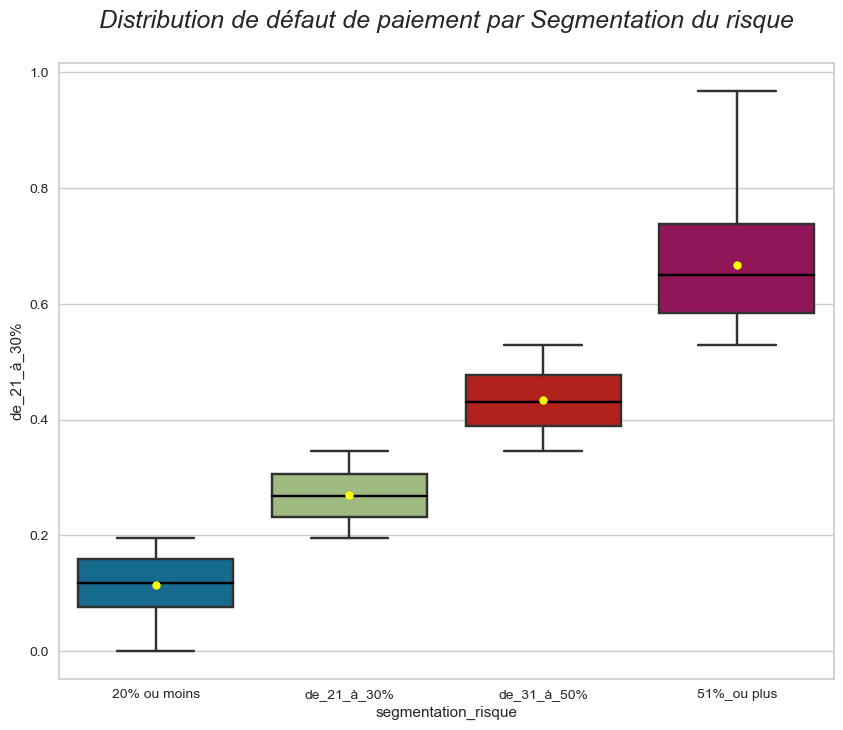

In [45]:
plt.figure(figsize = (10,8))
for m in df_work['segmentation_risque'].unique():
    
     
    # Propriétés graphiques     
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'yellow'}
    sns.boxplot( x=df_work.loc[df_work['segmentation_risque']==m]['segmentation_risque'],y=df_work['classe_1_proba'], showfliers=False,medianprops=medianprops, showmeans=True, meanprops=meanprops)
    plt.title("Distribution de défaut de paiement par Segmentation du risque\n",
          loc="center", fontsize=18, fontstyle='italic')
    plt.ylabel(m)


Text(0.5, 1.0, 'clean_X_train')

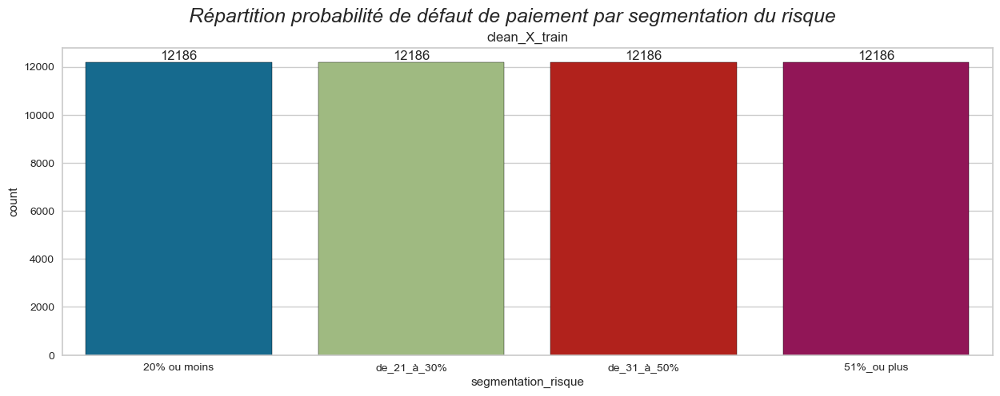

In [46]:
plt.figure(figsize = (15,5))

plt.suptitle("Répartition probabilité de défaut de paiement par segmentation du risque", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=df_work, x="segmentation_risque", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')

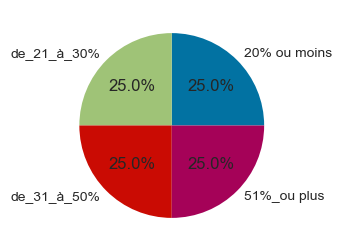

In [47]:
type_count = df_work['segmentation_risque'].value_counts().reset_index()
plt.figure(figsize = (3,3))
plt.pie(labels=type_count['index'], x=type_count['segmentation_risque'], autopct='%.1f%%')
plt.show()

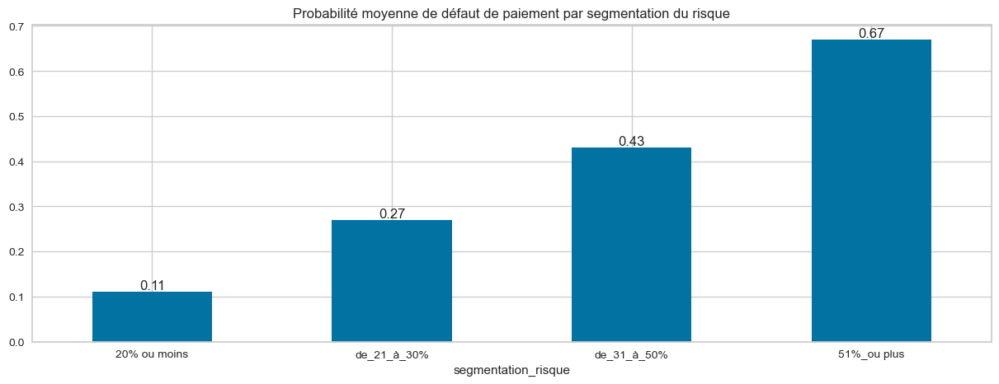

In [48]:
plt.figure(figsize = (15,5))

ax=round(df_work.groupby('segmentation_risque')['classe_1_proba'].mean(),2).plot(kind='bar')            
ax.bar_label(ax.containers[0])
plt.title('Probabilité moyenne de défaut de paiement par segmentation du risque')
plt.xticks(rotation=0, horizontalalignment="center")
plt.xlabel('segmentation_risque')
plt.show()

In [49]:
# Moyenne des variables par classe
df_work_mean = df_work.groupby(['segmentation_risque']).mean()

In [50]:
df_work_mean=df_work_mean.reset_index(drop=False, inplace=False)

In [51]:
df_work_mean

,segmentation_risque,classe_1_proba,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,20% ou moins,0.114926,-0.028247,-0.291994,-0.005834,0.005075,-0.015687,-0.067801,-0.006909,-0.054124,...,-0.007264,-0.003168,-0.008208,-0.004556,-0.000425,-0.008349,-0.003544,-0.000815,-0.003667,-0.000121
1,de_21_à_30%,0.269093,-0.007062,-0.077829,0.003107,0.021712,-0.004784,-0.039208,-0.003066,-0.015264,...,-0.001753,-0.001013,-0.003262,0.001061,-0.000547,-0.005111,-0.001164,0.007797,-0.001851,0.000247
2,de_31_à_50%,0.433279,0.006780,0.070759,0.008065,0.037166,-0.000263,-0.025169,-0.002514,0.023961,...,0.000514,-0.000089,0.001854,0.005170,-0.000289,0.001132,0.001306,0.016451,-0.001546,0.000494
3,51%_ou plus,0.666844,0.021824,0.290162,0.014438,0.058128,0.003045,-0.007719,0.000001,0.073292,...,0.005350,0.001733,0.010027,0.008666,-0.000484,0.008062,0.003300,0.028631,-0.002025,0.000632


In [59]:
# on peut imprimer l'identifiant client à partir de X_test_raw
idx=4
shap_client=df_work[df_work.index==idx]
print("Identifiant du Client : ", X_test_raw.iloc[idx, 0])
print("**"*18)
shap_client

Identifiant du Client :  100038
************************************


,identification_client,segmentation_risque,classe_1_proba,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
4,100038,51%_ou plus,0.591936,-0.004848,0.20005,-0.006745,0.137638,0.051568,0.129714,0.011237,...,-0.036773,-0.003714,0.09108,0.033258,0.001547,-0.012888,0.005735,0.078163,-0.006174,-0.00309


In [53]:
df_work.head(5)

,segmentation_risque,classe_1_proba,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,20% ou moins,0.058608,-0.009359,-1.534239,-0.004835,-0.063281,-0.031738,0.166503,0.034118,-0.208978,...,-0.053724,-0.006301,-0.021995,0.047716,-0.000728,-0.019082,-0.014587,0.023020,-0.003953,0.000088
1,de_31_à_50%,0.433296,0.010475,0.391015,0.029471,-0.004150,0.056598,-0.424041,0.026376,-0.023413,...,-0.048292,-0.006107,-0.038118,0.028086,-0.001719,-0.013122,-0.011270,0.044482,-0.002898,-0.000959
2,20% ou moins,0.111126,-0.003454,-0.398228,0.018079,0.058624,-0.069240,0.132703,0.064506,-0.107974,...,-0.054800,-0.006152,-0.033218,0.019957,0.000831,-0.014931,-0.006648,-0.193694,-0.001027,-0.043964
3,51%_ou plus,0.542976,0.004627,0.098292,0.008777,-0.073236,-0.031697,0.064487,0.065354,0.179107,...,-0.025344,-0.012146,-0.009015,-0.023498,0.007897,-0.011317,-0.015367,0.021242,0.000663,0.000669
4,51%_ou plus,0.591936,-0.004848,0.200050,-0.006745,0.137638,0.051568,0.129714,0.011237,0.153155,...,-0.036773,-0.003714,0.091080,0.033258,0.001547,-0.012888,0.005735,0.078163,-0.006174,-0.003090


In [54]:
df_work[df_work.classe_1_proba>0.9]

,segmentation_risque,classe_1_proba,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
37,51%_ou plus,0.914138,0.111668,0.148241,0.079763,0.152844,0.037089,0.033551,0.052593,0.284310,...,0.006901,-0.004340,0.169049,0.032177,0.004533,-0.008610,-0.011385,0.094704,-0.017148,-0.013983
298,51%_ou plus,0.913560,0.016984,0.534999,-0.006377,0.091782,0.037385,0.024869,0.012619,-0.088603,...,0.174806,-0.012271,-0.015047,0.015219,0.000652,-0.016323,-0.004927,0.078092,-0.001035,-0.000743
998,51%_ou plus,0.914585,0.014751,1.054054,-0.001400,0.097783,0.022493,0.092958,0.053528,0.043352,...,-0.013346,-0.006524,-0.036161,0.025024,0.001803,0.097303,0.020865,0.105907,-0.003480,-0.002095
1610,51%_ou plus,0.908860,0.124659,0.335980,0.027026,0.047741,0.040389,0.171550,-0.029457,0.151309,...,-0.037735,-0.003197,-0.029251,0.019960,0.005314,-0.013180,-0.012414,0.082946,-0.006056,-0.000196
1634,51%_ou plus,0.941231,-0.013269,0.242970,0.044338,0.107302,0.047245,0.056713,0.024366,0.223542,...,-0.016813,-0.004974,0.092763,0.059907,0.002759,0.124088,0.010202,0.066292,-0.010275,-0.002119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47359,51%_ou plus,0.942705,0.010716,0.580436,0.010849,0.066026,0.035223,0.183120,0.000721,0.178803,...,-0.049367,-0.005456,-0.015194,0.039818,0.003485,0.146339,-0.025108,0.090100,-0.000544,-0.002679
47394,51%_ou plus,0.917786,0.124121,0.196674,0.058675,0.069925,0.069450,0.063618,0.030814,0.185579,...,-0.015383,-0.011483,-0.021496,-0.023176,0.009629,-0.010917,-0.001050,0.079876,-0.003265,-0.001270
47901,51%_ou plus,0.902185,0.016108,1.266767,-0.053730,0.102060,0.040013,-0.057475,-0.016545,0.061050,...,0.040616,-0.006054,-0.012934,0.028864,0.006788,-0.004415,0.002161,0.087548,-0.001249,-0.006117
47950,51%_ou plus,0.941802,-0.012381,-0.276553,0.031332,-0.037182,0.062211,0.178513,-0.003653,-0.055519,...,-0.022831,-0.015000,-0.008403,0.014922,0.007163,-0.008052,0.006232,0.052584,0.013507,0.006923


In [55]:
df_work['identification_client']=X_test_raw['sk_id_curr']
# shift column 'Name' to first position
first_column = df_work.pop('identification_client')
  
# insert column using insert(position,column_name,
# first_column) function
df_work.insert(0, 'identification_client', first_column)
  

In [56]:
df_work.head()

,identification_client,segmentation_risque,classe_1_proba,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,100001,20% ou moins,0.058608,-0.009359,-1.534239,-0.004835,-0.063281,-0.031738,0.166503,0.034118,...,-0.053724,-0.006301,-0.021995,0.047716,-0.000728,-0.019082,-0.014587,0.023020,-0.003953,0.000088
1,100005,de_31_à_50%,0.433296,0.010475,0.391015,0.029471,-0.004150,0.056598,-0.424041,0.026376,...,-0.048292,-0.006107,-0.038118,0.028086,-0.001719,-0.013122,-0.011270,0.044482,-0.002898,-0.000959
2,100013,20% ou moins,0.111126,-0.003454,-0.398228,0.018079,0.058624,-0.069240,0.132703,0.064506,...,-0.054800,-0.006152,-0.033218,0.019957,0.000831,-0.014931,-0.006648,-0.193694,-0.001027,-0.043964
3,100028,51%_ou plus,0.542976,0.004627,0.098292,0.008777,-0.073236,-0.031697,0.064487,0.065354,...,-0.025344,-0.012146,-0.009015,-0.023498,0.007897,-0.011317,-0.015367,0.021242,0.000663,0.000669
4,100038,51%_ou plus,0.591936,-0.004848,0.200050,-0.006745,0.137638,0.051568,0.129714,0.011237,...,-0.036773,-0.003714,0.091080,0.033258,0.001547,-0.012888,0.005735,0.078163,-0.006174,-0.003090


In [58]:
df_work.loc[df_work['identification_client']==100038]


,identification_client,segmentation_risque,classe_1_proba,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
4,100038,51%_ou plus,0.591936,-0.004848,0.20005,-0.006745,0.137638,0.051568,0.129714,0.011237,...,-0.036773,-0.003714,0.09108,0.033258,0.001547,-0.012888,0.005735,0.078163,-0.006174,-0.00309


In [7]:
X_test_raw=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\X_test_raw.csv')

In [8]:
X_test_raw.columns

Index(['sk_id_curr', 'region_rating_client', 'ext_source_2',
       'taux_endettement', 'nb_mensualites', 'total_revenus', 'montant_credit',
       'population_region', 'age_client', 'anciennete_entreprise',
       'year_registration', 'anciennete_cid', 'nb_famille',
       'heure_demande_pret', 'anciennete_portable',
       'nb_demande_pret_precedent', 'montant_demande_pret_precedent',
       'heure_demande_pret_precedent', 'nb_year_depuis_decision_precedente',
       'prev_contrat_statut_canceled', 'prev_contrat_statut_refused',
       'prev_contrat_statut_unused offer', 'prev_contrat_type_consumer_loans',
       'prev_contrat_type_revolving_loans', 'num_instalment_version',
       'num_instalment_number', 'montant_paye_vs_du', 'days_past_due',
       'days_before_due', 'days_credit', 'amt_credit_sum',
       'bureau_credit_actif_closed', 'bureau_credit_type_credit_card',
       'bureau_credit_type_other_credit',
       'solde_cb_statut_actif_avec_jours_retard', 'solde_cb_statut_clos

In [9]:
X_test_raw.head()

,sk_id_curr,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,anciennete_entreprise,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,100001,1,0.789654,2,2,1,3,2,4,3,...,0,1,0,0,1,1,1,1,0,0
1,100005,1,0.291656,2,0,0,0,4,3,4,...,0,1,0,0,1,1,1,1,0,0
2,100013,1,0.699787,4,0,3,3,2,4,4,...,0,1,0,0,1,1,1,0,0,1
3,100028,1,0.509677,2,2,4,5,3,2,2,...,0,1,0,1,1,1,1,1,0,0
4,100038,1,0.425687,2,1,3,3,1,1,3,...,0,1,1,0,1,1,0,1,0,0


In [76]:
X_test_mod=pd.read_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\preproc\X_test_mod.csv')

In [77]:
X_test_mod.head()

,region_rating_client,ext_source_2,taux_endettement,nb_mensualites,total_revenus,montant_credit,population_region,age_client,anciennete_entreprise,year_registration,...,name_family_status_seul,name_housing_type_maison_appartement,flag_work_phone_Oui,flag_phone_Oui,reg_region_not_work_region_adresse_identique,reg_city_not_live_city_adresse_identique,reg_city_not_work_city_adresse_identique,flag_document_3_Oui,flag_document_6_Oui,flag_document_8_Oui
0,1,0.789654,2,2,1,3,2,4,3,2,...,0,1,0,0,1,1,1,1,0,0
1,1,0.291656,2,0,0,0,4,3,4,3,...,0,1,0,0,1,1,1,1,0,0
2,1,0.699787,4,0,3,3,2,4,4,1,...,0,1,0,0,1,1,1,0,0,1
3,1,0.509677,2,2,4,5,3,2,2,0,...,0,1,0,1,1,1,1,1,0,0
4,1,0.425687,2,1,3,3,1,1,3,1,...,0,1,1,0,1,1,0,1,0,0
